In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

import geopandas as gpd
import pandas as pd
import pygris
import matplotlib.pyplot as plt
from IPython.display import display
import numpy as np
import matplotlib
from tqdm.notebook import tqdm
import osmnx as ox
import contextily as cx
import json

matplotlib.rcParams['figure.dpi'] = 300

# supress pandas warnings


### Download PM 2.5 hyperlocal measurements from MIT-Seansable City

In [3]:
urls = [
    f"https://raw.githubusercontent.com/MIT-Senseable-City-Lab/OSCS/main/Explore/Datasets/NYC_Pilot2_PM_Part{i}.csv"
    for i in [1, 2, 3]
]

info = {
    "target": "pm25",
    "lat": "latitude",
    "lon": "longitude",
    "time": "time",
    "time_input_format": "unix",
    "time_zone": "US/Eastern",
    "features": ["temperature", "humidity"],
    "ids": ["SensorID"],
}

# download the three datasets
pts = []
for url in urls:
    chunk = pd.read_csv(url)
    pts.append(chunk)
pts = pd.concat(pts, ignore_index=True)

# convert the time column to local time
pts["time"] = pd.to_datetime(pts[info["time"]], unit="s")
pts["time"] = pts["time"].dt.tz_localize("UTC").dt.tz_convert(info["time_zone"])

# filter columns
cols = (
    info["ids"]
    + [info["time"], info["lon"], info["lat"], info["target"]]
    + info["features"]
)
pts = pts[cols]

# rename lon/lat columns
pts = pts.rename(columns={info["lon"]: "lon", info["lat"]: "lat"})

pts["time_of_day"] = pts.time.dt.hour + pts.time.dt.minute / 60
pts["weekday"] = pts.time.dt.weekday

# keep measurements during weekdays and 9am to 5pm
pts = pts[(pts.weekday < 5) & (pts.time_of_day >= 9) & (pts.time_of_day <= 17)]


display(pts)

,SensorID,time,lon,lat,pm25,temperature,humidity,time_of_day,weekday
237,NYCP2_CS01A,2021-09-10 09:00:01-04:00,-73.870544,40.845364,5.193294,21.5,66.1,9.0,4
238,NYCP2_CS01A,2021-09-10 09:00:06-04:00,-73.870544,40.845364,4.643380,21.5,65.7,9.0,4
239,NYCP2_CS01A,2021-09-10 09:00:11-04:00,-73.870567,40.845364,5.245350,21.5,65.9,9.0,4
240,NYCP2_CS01A,2021-09-10 09:00:16-04:00,-73.870567,40.845356,5.128048,21.5,66.4,9.0,4
241,NYCP2_CS01A,2021-09-10 09:00:21-04:00,-73.870567,40.845352,4.395787,21.6,67.0,9.0,4
...,...,...,...,...,...,...,...,...,...
515848,NYCP2_CS05A,2021-09-23 15:18:14-04:00,-73.870659,40.845161,12.101344,28.5,64.8,15.3,3
515849,NYCP2_CS05A,2021-09-23 15:18:19-04:00,-73.870659,40.845161,12.275798,28.5,65.0,15.3,3
515850,NYCP2_CS05A,2021-09-23 15:18:24-04:00,-73.870659,40.845161,3.284671,28.5,64.9,15.3,3
515851,NYCP2_CS05A,2021-09-23 15:18:29-04:00,-73.870659,40.845161,12.101344,28.5,65.0,15.3,3


In [4]:
# print date range
print(pts.time.min(), pts.time.max())

2021-09-10 09:00:00-04:00 2021-12-15 09:35:55-05:00


### Coarsen points / keep polygons that contain points

Processed points


,lon,lat,pm25,pm25_q10,pm25_q90,time_of_day,geometry
0,-73.9390,40.7226,5.932020,5.869893,7.575018,11.283333,POINT (-73.93900 40.72260)
1,-73.9390,40.7228,6.957569,6.137130,7.778008,11.300000,POINT (-73.93900 40.72280)
2,-73.9390,40.7232,7.983117,7.983117,7.983117,11.300000,POINT (-73.93900 40.72320)
3,-73.9388,40.7224,6.158338,6.158338,6.158338,11.266667,POINT (-73.93880 40.72240)
4,-73.9388,40.7226,6.158338,5.926265,7.302951,11.283333,POINT (-73.93880 40.72260)
...,...,...,...,...,...,...,...
12736,-73.8216,40.8862,7.032698,7.032698,7.032698,16.850000,POINT (-73.82160 40.88620)
12737,-73.8212,40.8858,4.168586,4.168586,4.168586,16.850000,POINT (-73.82120 40.88580)
12738,-73.8210,40.8846,9.504913,9.504913,9.504913,16.850000,POINT (-73.82100 40.88460)
12739,-73.8208,40.8850,4.168586,4.168586,4.168586,16.850000,POINT (-73.82080 40.88500)


Using the default year of 2021
Using FIPS code '36' for input 'NY'
Using FIPS code '005' for input 'Bronx'
Roads


,LINEARID,FULLNAME,RTTYP,MTFCC,geometry
0,1104691956808,Bryant Ave Ovp,M,S1710,"LINESTRING (-73.88891 40.82181, -73.88857 40.8..."
1,110391525903,Putnam Ave W Exd,M,S1400,"LINESTRING (-73.90028 40.88302, -73.90014 40.8..."
2,110391524230,E 177th St Exd,M,S1400,"LINESTRING (-73.80205 40.81721, -73.80117 40.8..."
3,110391523610,5th Ave Exd,M,S1400,"LINESTRING (-73.81216 40.82314, -73.81230 40.8..."
4,110391528344,Cross Bx Svc Rd Exd,O,S1640,"LINESTRING (-73.88568 40.84051, -73.88492 40.8..."
...,...,...,...,...,...
3348,11012812945824,None,None,S1780,"LINESTRING (-73.86609 40.82136, -73.86542 40.8..."
3349,110391526368,Dogwood Dr,M,S1400,"LINESTRING (-73.86176 40.84151, -73.86127 40.8..."
3350,11012812959297,None,None,S1710,"LINESTRING (-73.86081 40.84048, -73.86076 40.8..."
3351,110391527948,Spencer Pl,M,S1400,"LINESTRING (-73.89812 40.91180, -73.89742 40.9..."


Using FIPS code '36' for input 'NY'
Using FIPS code '005' for input 'Bronx'
Tracts


,STATEFP,COUNTYFP,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,LSAD,ALAND,AWATER,geometry
TRACTCE,,,,,,,,,,,,,
9200,36,005,1400000US36005009200,36005009200,92,Census Tract 92,NY,Bronx County,New York,CT,310475,0,"POLYGON ((-73.86034 40.83329, -73.85906 40.833..."
6400,36,005,1400000US36005006400,36005006400,64,Census Tract 64,NY,Bronx County,New York,CT,167185,0,"POLYGON ((-73.87395 40.83424, -73.87380 40.835..."
36501,36,005,1400000US36005036501,36005036501,365.01,Census Tract 365.01,NY,Bronx County,New York,CT,95827,0,"POLYGON ((-73.88832 40.84518, -73.88776 40.844..."
7900,36,005,1400000US36005007900,36005007900,79,Census Tract 79,NY,Bronx County,New York,CT,197933,0,"POLYGON ((-73.90822 40.81620, -73.90759 40.816..."
24700,36,005,1400000US36005024700,36005024700,247,Census Tract 247,NY,Bronx County,New York,CT,149162,0,"POLYGON ((-73.92096 40.85511, -73.92000 40.856..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42500,36,005,1400000US36005042500,36005042500,425,Census Tract 425,NY,Bronx County,New York,CT,293818,0,"POLYGON ((-73.88362 40.86726, -73.88184 40.868..."
7300,36,005,1400000US36005007300,36005007300,73,Census Tract 73,NY,Bronx County,New York,CT,140161,0,"POLYGON ((-73.91194 40.81605, -73.91102 40.815..."
15100,36,005,1400000US36005015100,36005015100,151,Census Tract 151,NY,Bronx County,New York,CT,208933,0,"POLYGON ((-73.90227 40.82964, -73.90025 40.831..."


<Axes: >

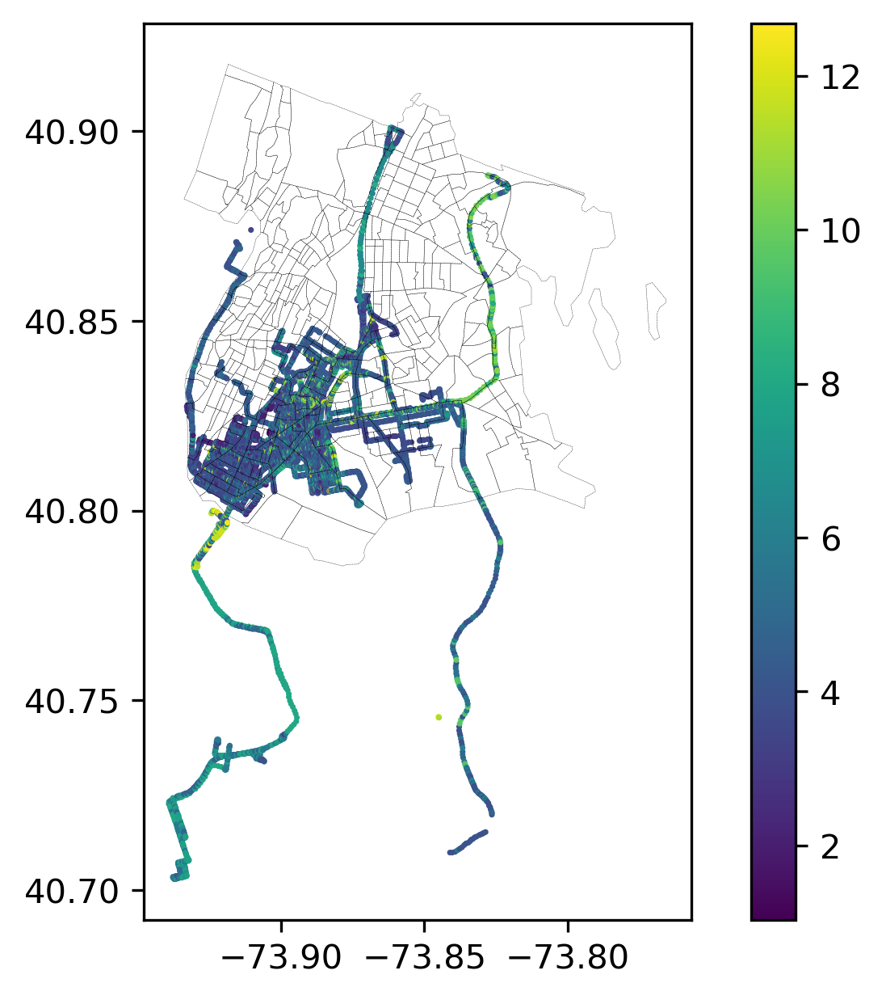

In [5]:
import functools

# projection useful throughout
wgs84 = "EPSG:4326"  # unit is degrees
mercator = "EPSG:3857"  # unit is meters, useful for meter computations

#  ==== RANK 0: POINTS ====
# to reduce dim by aggregating measurements by time and location
delta_s = 0.0002 # 0.0001 deg ~ 20m
# delta_t = "15min"
pts["lon"] = delta_s * np.round(pts.lon / delta_s)
pts["lat"] = delta_s * np.round(pts.lat / delta_s)
# pts["time"] = pts.time.dt.round(delta_t, ambiguous="NaT")
# comptue time of day as fraction of day in (0, 1)

# keep only time of day not date and weekday
# pts["time"], pts["weekday"] = pts.time.dt.time, pts.time.dt.weekday
group_cols = ["lon", "lat"]
q90 = functools.partial(np.quantile, q=0.9)
q50 = functools.partial(np.quantile, q=0.5)
q10 = functools.partial(np.quantile, q=0.1)
pts = pts.groupby(group_cols).agg(
    pm25=pd.NamedAgg(column="pm25", aggfunc=q50),
    pm25_q10=pd.NamedAgg(column="pm25", aggfunc=q10),
    pm25_q90=pd.NamedAgg(column="pm25", aggfunc=q90),
    time_of_day=pd.NamedAgg(column="time_of_day", aggfunc=q50),
).reset_index()


# convert to geopandas
geom = gpd.points_from_xy(pts.lon, pts.lat, crs=wgs84)
pts = gpd.GeoDataFrame(pts, geometry=geom)
print("Processed points")
display(pts)

# ==== RANK 1: ROADS =====
roads = pygris.roads(state="NY", county="Bronx").to_crs(wgs84)
print("Roads")
display(roads)

# ==== RANK 2: TRACTS ====
tracts = pygris.tracts(
    state="NY", county="Bronx", year=2020, cache=True, cb=True
).to_crs(wgs84)
tracts["TRACTCE"] = tracts["TRACTCE"].astype(int)
tracts.set_index("TRACTCE", inplace=True)
print("Tracts")
display(tracts)

# visualize PM25
fig, ax = plt.subplots()
# roads.plot(ax=ax, color="black", lw=0.1)
tracts.boundary.plot(ax=ax, color="black", lw=0.1, ls="--")
pts.plot(column="pm25", ax=ax, legend=True, markersize=0.5)

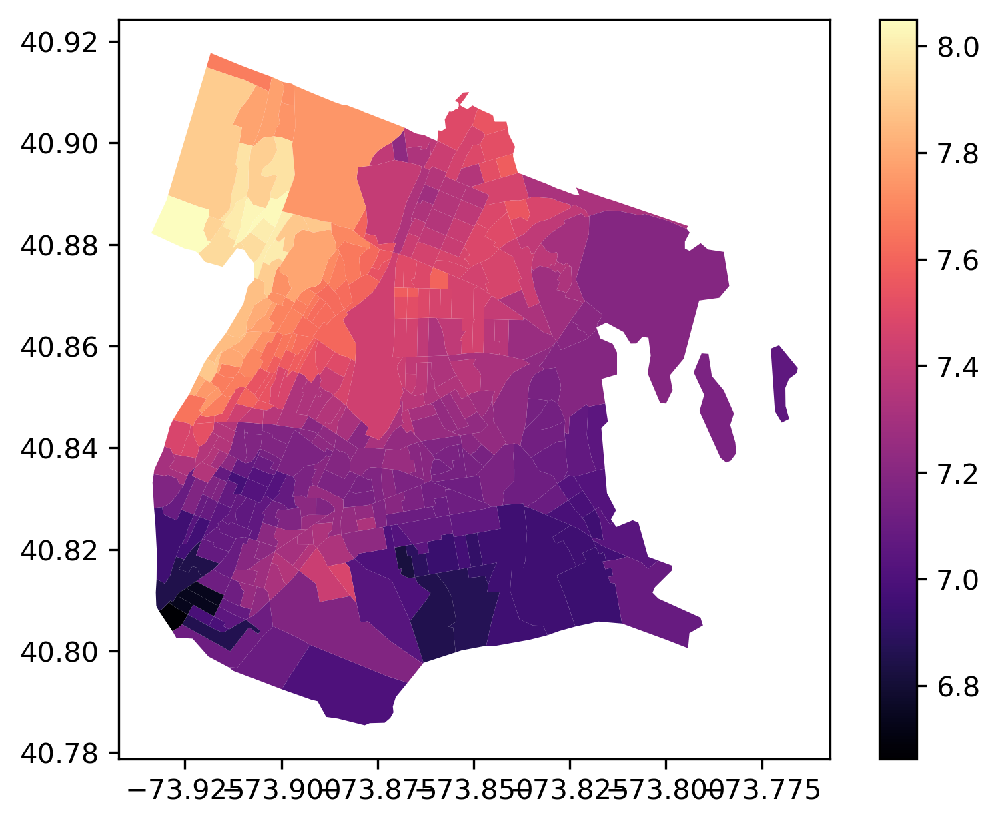

In [6]:
# cat pm25 to tracts
# these data already has only the months of the study period
monthly_tract_pm = pd.read_parquet("data/raw/monthly_bronx_ushap_2020.parquet")
monthly_tract_pm = monthly_tract_pm[monthly_tract_pm.month.isin([9, 10, 11, 12])]
tract_pm = (
    monthly_tract_pm
    .reset_index()
    .rename(columns={"bronx": "GEOID"})
    .groupby("GEOID")  # rename and aggregate by month at the same time
    .agg(coarse_pm25=pd.NamedAgg(column="PM2.5", aggfunc="mean"))
    .reset_index()
    .set_index("GEOID")
)

# left join on GEOID columns
tracts["coarse_pm25"] = tract_pm.coarse_pm25.loc[tracts.GEOID.values].values
# tracts = tracts.merge(tract_pm, how="left", on="GEOID")
tracts.plot(column="coarse_pm25", legend=True, cmap="magma")
import os
os.makedirs("notebooks/diagfigs", exist_ok=True)
plt.savefig("notebooks/diagfigs/bronx_pm25.png")

Keep only valid points/roads/tracts that interesect

In [7]:
 # ==== KEEP ONLY THE VALID POINTS =====
 
# obtain pts to road_map with 5m buffer
geom = roads.geometry.to_crs(mercator).buffer(5).to_crs(wgs84)
road_buff = gpd.GeoDataFrame(geometry=geom)
sjoin1 = gpd.sjoin(pts, road_buff, predicate="within", how="inner")
valid_pts1 = sjoin1.index.unique()

geom = tracts.geometry.to_crs(mercator).buffer(5).to_crs(wgs84)
tract_buff = gpd.GeoDataFrame(geometry=geom)
sjoin2 = gpd.sjoin(pts, tract_buff, predicate="within", how="inner")
valid_pts2 = sjoin2.index.unique()

valid_pts = list(set(valid_pts1) & set(valid_pts2))

# subset valid points, roads, and tracts
pts = pts.loc[valid_pts]
sjoin1 = sjoin1.loc[sjoin1.index.isin(valid_pts)]
sjoin2 = sjoin2.loc[sjoin2.index.isin(valid_pts)]
valid_roads = sjoin1.index_right.unique()
valid_tracts = sjoin2.index_right.unique()
sjoin1 = sjoin1.loc[sjoin1.index_right.isin(valid_roads)]
sjoin2 = sjoin2.loc[sjoin2.index_right.isin(valid_tracts)]
roads = roads.loc[valid_roads]
roads_buff = road_buff.loc[valid_roads]
tracts = tracts.loc[valid_tracts]
tract_buff = tract_buff.loc[valid_tracts]

# reset the indexes
ixmap_pts = {k: i for i, k in enumerate(pts.index)}
ixmap_roads = {k: i for i, k in enumerate(roads.index)}
ixmap_tracts = {k: i for i, k in enumerate(tracts.index)}

## we actually want to keep the original indices for matching information
## except for pts, in which it doesn't make sense

print("Final set of points")
display(pts)

print("Final set of roads")
display(roads)

print("Final set of tracts")
display(tracts)

Final set of points


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(


,lon,lat,pm25,pm25_q10,pm25_q90,time_of_day,geometry
8199,-73.8882,40.8266,3.288390,3.282128,6.319406,11.183333,POINT (-73.88820 40.82660)
8201,-73.8882,40.8288,4.348238,4.348238,4.348238,13.200000,POINT (-73.88820 40.82880)
8207,-73.8882,40.8330,10.109027,3.983952,10.122329,14.033333,POINT (-73.88820 40.83300)
8214,-73.8882,40.8366,4.366279,4.183322,4.610648,14.966667,POINT (-73.88820 40.83660)
8218,-73.8882,40.8398,3.763369,3.763369,3.763369,14.766667,POINT (-73.88820 40.83980)
...,...,...,...,...,...,...,...
8183,-73.8882,40.8178,3.087006,3.070325,3.109214,9.716667,POINT (-73.88820 40.81780)
8186,-73.8882,40.8204,5.729451,5.729057,10.516564,12.183333,POINT (-73.88820 40.82040)
8187,-73.8882,40.8206,5.471461,3.177321,5.938519,10.750000,POINT (-73.88820 40.82060)
8189,-73.8882,40.8214,10.635258,4.364834,11.713342,15.650000,POINT (-73.88820 40.82140)


Final set of roads


,LINEARID,FULLNAME,RTTYP,MTFCC,geometry
1705,1105089436395,None,None,S1630,"LINESTRING (-73.93258 40.82553, -73.93258 40.8..."
1073,1104492919899,Pedestrian Opas,M,S1710,"LINESTRING (-73.93150 40.83084, -73.93194 40.8..."
1666,1106087439044,Major Deegan Expy,M,S1100,"LINESTRING (-73.87801 40.90596, -73.87811 40.9..."
2360,1104701100699,I- 87,I,S1100,"LINESTRING (-73.91148 40.80494, -73.91233 40.8..."
592,11015503292274,I- 87,I,S1100,"LINESTRING (-73.87819 40.90598, -73.87829 40.9..."
...,...,...,...,...,...
984,1104699162063,I- 695,I,S1100,"LINESTRING (-73.81151 40.81946, -73.81287 40.8..."
1995,1108475888251,Throgs Neck Expy,M,S1100,"LINESTRING (-73.82525 40.83694, -73.82461 40.8..."
999,110391527854,Pinkney Ave,M,S1400,"LINESTRING (-73.82354 40.88565, -73.82418 40.8..."
2744,110391529433,Hutchinson Ave,M,S1400,"LINESTRING (-73.82259 40.88594, -73.82278 40.8..."


Final set of tracts


,STATEFP,COUNTYFP,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,LSAD,ALAND,AWATER,geometry,coarse_pm25
TRACTCE,,,,,,,,,,,,,,
6301,36,005,1400000US36005006301,36005006301,63.01,Census Tract 63.01,NY,Bronx County,New York,CT,782166,9963,"POLYGON ((-73.93306 40.82816, -73.93146 40.828...",6.955000
18900,36,005,1400000US36005018900,36005018900,189,Census Tract 189,NY,Bronx County,New York,CT,355570,0,"POLYGON ((-73.93314 40.83481, -73.93035 40.834...",7.175000
5100,36,005,1400000US36005005100,36005005100,51,Census Tract 51,NY,Bronx County,New York,CT,510445,0,"POLYGON ((-73.93260 40.81152, -73.93240 40.814...",6.850000
19300,36,005,1400000US36005019300,36005019300,193,Census Tract 193,NY,Bronx County,New York,CT,241287,0,"POLYGON ((-73.93301 40.83568, -73.93061 40.839...",7.300000
1901,36,005,1400000US36005001901,36005001901,19.01,Census Tract 19.01,NY,Bronx County,New York,CT,205007,0,"POLYGON ((-73.93094 40.80825, -73.92933 40.809...",6.662500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30201,36,005,1400000US36005030201,36005030201,302.01,Census Tract 302.01,NY,Bronx County,New York,CT,221595,0,"POLYGON ((-73.82826 40.86085, -73.82642 40.863...",7.200000
48401,36,005,1400000US36005048401,36005048401,484.01,Census Tract 484.01,NY,Bronx County,New York,CT,504791,0,"POLYGON ((-73.84044 40.88473, -73.83773 40.885...",7.475000
27600,36,005,1400000US36005027600,36005027600,276,Census Tract 276,NY,Bronx County,New York,CT,1837997,499778,"POLYGON ((-73.83282 40.85612, -73.83199 40.856...",7.189285


In [8]:
print("length if valid points", len(valid_pts))
print("length if valid roads", len(valid_roads))
print("length if valid tracts", len(valid_tracts))

# print max of ixmap keys
print("max of ixmap_pts", max(ixmap_pts.values()))
print("max of ixmap_roads", max(ixmap_roads.values()))
print("max of ixmap_tracts", max(ixmap_tracts.values()))

length if valid points 3946
length if valid roads 550
length if valid tracts 151
max of ixmap_pts 3945
max of ixmap_roads 549
max of ixmap_tracts 150


### Crosswalks (adjacencies cross-rank)

Create cells

In [9]:
cell_0 = [[i] for i in range(len(pts))]
cell_1 = [[] for _ in range(len(roads))]
map_0_1 = [[] for _ in range(len(pts))]
map_0_2 = [[] for _ in range(len(pts))]

for ix, row in sjoin1.iterrows():
    src = ixmap_pts[ix]
    dst = ixmap_roads[row["index_right"]]
    cell_1[dst].append(src)
    map_0_1[src].append(dst)

cell_2 = [[] for _ in range(len(tracts))]
for ix, row in sjoin2.iterrows():
    src = ixmap_pts[ix]
    dst = ixmap_tracts[row["index_right"]]
    cell_2[dst].append(src)
    map_0_2[src].append(dst)

pts["road"] = map_0_1
pts["tract"] = map_0_2
print("Augmented cols")
display(pts[["road", "tract"]])

# verify
print("Number of empty roads", sum(1 for c in cell_1 if not c))
print("Number of empty tracts", sum(1 for c in cell_2 if not c))
# print("Number of unmapped points to road", sum(1 for m in map_0_1 if m is None))
# print("Number of unmapped points to tract", sum(1 for m in map_0_2 if m is None))

Augmented cols


,road,tract
8199,[114],"[66, 73]"
8201,"[273, 226]",[76]
8207,[289],[78]
8214,[169],"[71, 81]"
8218,[305],"[72, 60]"
...,...,...
8183,[302],[77]
8186,[246],[77]
8187,[304],[77]
8189,[287],[77]


Number of empty roads 0
Number of empty tracts 0


Number of edges pts -> road 4944
Number of edges road -> tract 1331


<Axes: >

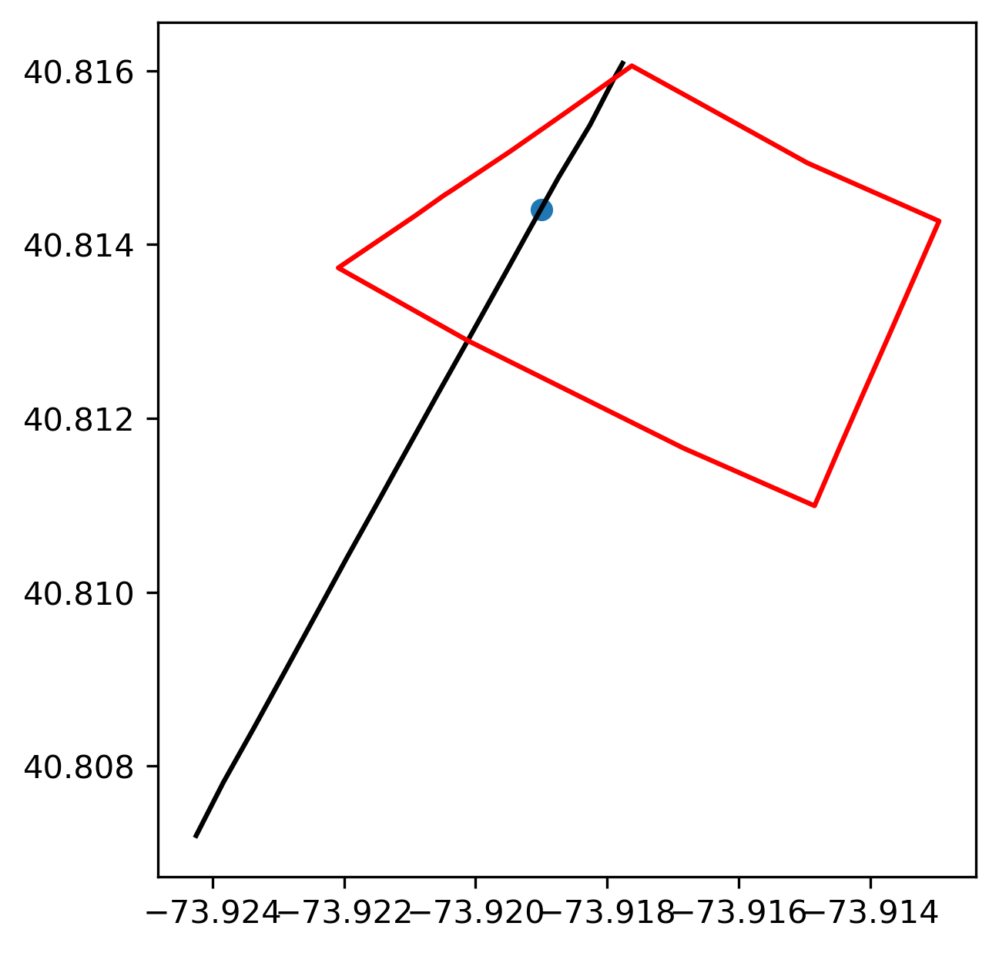

In [10]:
# === Incidences Rank 0 -> Rank 1 (used also as incidence(0, 1)) ====
edges_pts_road = set()
# for i, j in enumerate(map_0_1):
#     if j is not None:
#         edges_pts_road.append([i, j])
# point goes to a road if the road contains the point
for i in range(len(pts)):
    for j, c in enumerate(cell_1):
        if i in c:
            edges_pts_road.add((i, j))
edges_pts_road = list(edges_pts_road)
print("Number of edges pts -> road", len(edges_pts_road))

# === Incidences Rank 1 -> Rank 2 ====
# strategy: create neighbors if they road and tract share a point
edges_road_tract = set()
for i, road in enumerate(cell_1):
    for k, tract in enumerate(cell_2):
        if set(road) & set(tract):
            edges_road_tract.add((i, k))
edges_road_tract = list(edges_road_tract)
print("Number of edges road -> tract", len(edges_road_tract))

# map a point tract and road to verify
n = 1000
pt_n = pts.iloc[[n]]
road_n = roads.iloc[pt_n.road.values[0]]
tract_n = tracts.iloc[pt_n.tract.values[0]]
fig, ax = plt.subplots()
pt_n.plot(ax=ax)
road_n.plot(ax=ax, color="black")
tract_n.boundary.plot(ax=ax, color="red")

<Axes: >

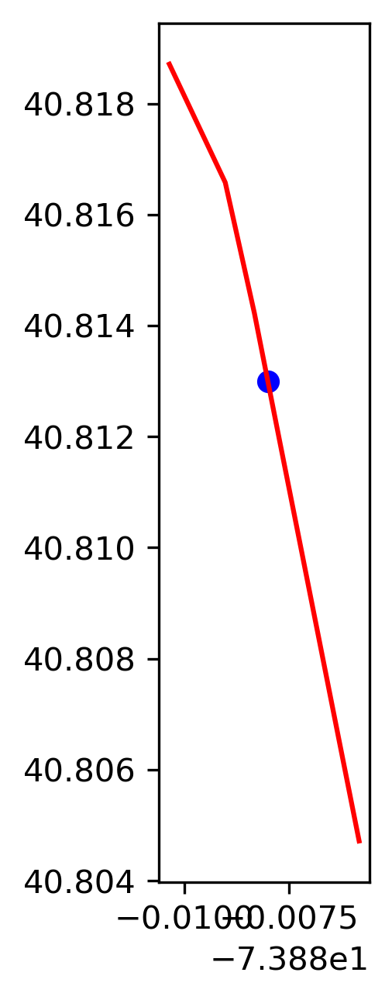

In [11]:
fig, ax = plt.subplots()
pt_n = 7
tgts = [e[1] for e in edges_pts_road if e[0] == pt_n]
p = pts.iloc[[pt_n]]
r = roads.iloc[tgts]
p.plot(ax=ax, color="blue")
r.plot(ax=ax, color="red")

<Axes: >

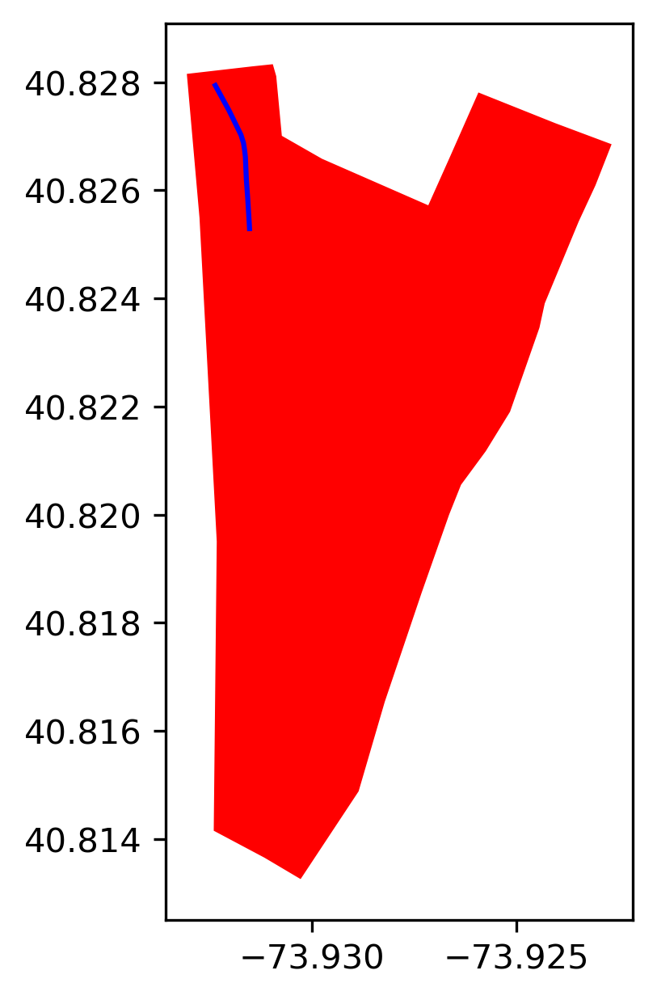

In [12]:
fig, ax = plt.subplots()
r_n = 7
tgts = [e[1] for e in edges_road_tract if e[0] == pt_n]
p = roads.iloc[[r_n]]
r = tracts.iloc[tgts]
p.plot(ax=ax, color="blue")
r.plot(ax=ax, color="red")

Road displayed 101


/var/folders/h3/2f91vbwj7r506n1w06610njh0000gn/T/ipykernel_57832/721658775.py:22: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  nbr_tracts.plot(
/var/folders/h3/2f91vbwj7r506n1w06610njh0000gn/T/ipykernel_57832/721658775.py:30: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  nbr_tracts.plot(


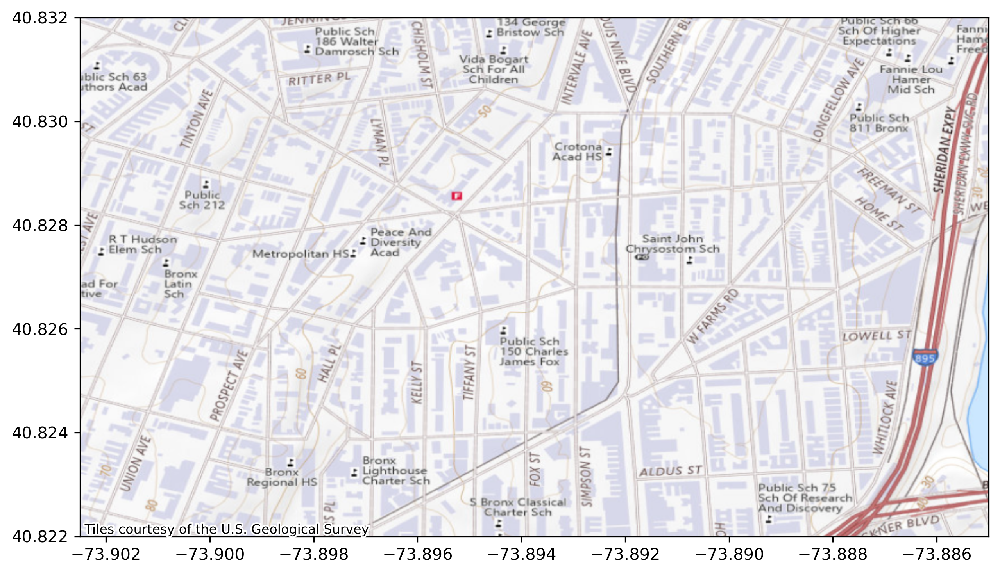

<Axes: >

In [13]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

#
road_counts = pd.Series([e[1] for e in edges_pts_road])
vc = road_counts.value_counts()
vc_k = vc.index[31]
print("Road displayed", vc_k)

#
tgt_pts = [e[0] for e in edges_pts_road if e[1] == vc_k]
tgt_roads = [vc_k]
tgt_tracts = [e[1] for e in edges_road_tract if e[0] == vc_k]


# Show an example
pts_k = pts.iloc[tgt_pts]
road_feats_k = roads.iloc[tgt_roads]
nbr_tracts = tracts.iloc[tgt_tracts]

# roads.plot(ax=ax, color="black", alpha=0.1)
# make fill collor always yello
nbr_tracts.plot(
    "id",
    alpha=0.3,
    lw=0.0,
    ls="--",
    color="yellow",
    ax=ax,
)
nbr_tracts.plot(
    "id",
    edgecolor="black",
    ls="--",
    alpha=1.0,
    lw=0.8,
    color="none",
    ax=ax,
    zorder=11
)
road_feats_k.plot(color="magenta", linewidth=3, ax=ax)
# ensure pts appear on top of other plots
pts_k.plot(markersize=10, ax=ax, c="blue", zorder=10)

# plt.title("Example of road intersecting tracts")


# make sure that the axis coordinates do not use scientific notation
ax.get_xaxis().get_major_formatter().set_useOffset(False)
ax.get_yaxis().get_major_formatter().set_useOffset(False)
plt.xlim(-73.9025, -73.885)
plt.ylim(40.822, 40.832)
cx.add_basemap(ax, crs=tracts.crs, zoom=16, source=cx.providers.USGS.USTopo)
plt.show()

# save as png
fig.savefig("notebooks/spatial-cc-example.png", bbox_inches="tight")
ax

### Points

Visualize points/pm25

,lon,lat,pm25,pm25_q10,pm25_q90,time_of_day,geometry,road,tract
8199,-73.8882,40.8266,3.288390,3.282128,6.319406,11.183333,POINT (-73.88820 40.82660),[114],"[66, 73]"
8201,-73.8882,40.8288,4.348238,4.348238,4.348238,13.200000,POINT (-73.88820 40.82880),"[273, 226]",[76]
8207,-73.8882,40.8330,10.109027,3.983952,10.122329,14.033333,POINT (-73.88820 40.83300),[289],[78]
8214,-73.8882,40.8366,4.366279,4.183322,4.610648,14.966667,POINT (-73.88820 40.83660),[169],"[71, 81]"
8218,-73.8882,40.8398,3.763369,3.763369,3.763369,14.766667,POINT (-73.88820 40.83980),[305],"[72, 60]"
...,...,...,...,...,...,...,...,...,...
8183,-73.8882,40.8178,3.087006,3.070325,3.109214,9.716667,POINT (-73.88820 40.81780),[302],[77]
8186,-73.8882,40.8204,5.729451,5.729057,10.516564,12.183333,POINT (-73.88820 40.82040),[246],[77]
8187,-73.8882,40.8206,5.471461,3.177321,5.938519,10.750000,POINT (-73.88820 40.82060),[304],[77]
8189,-73.8882,40.8214,10.635258,4.364834,11.713342,15.650000,POINT (-73.88820 40.82140),[287],[77]


<Axes: >

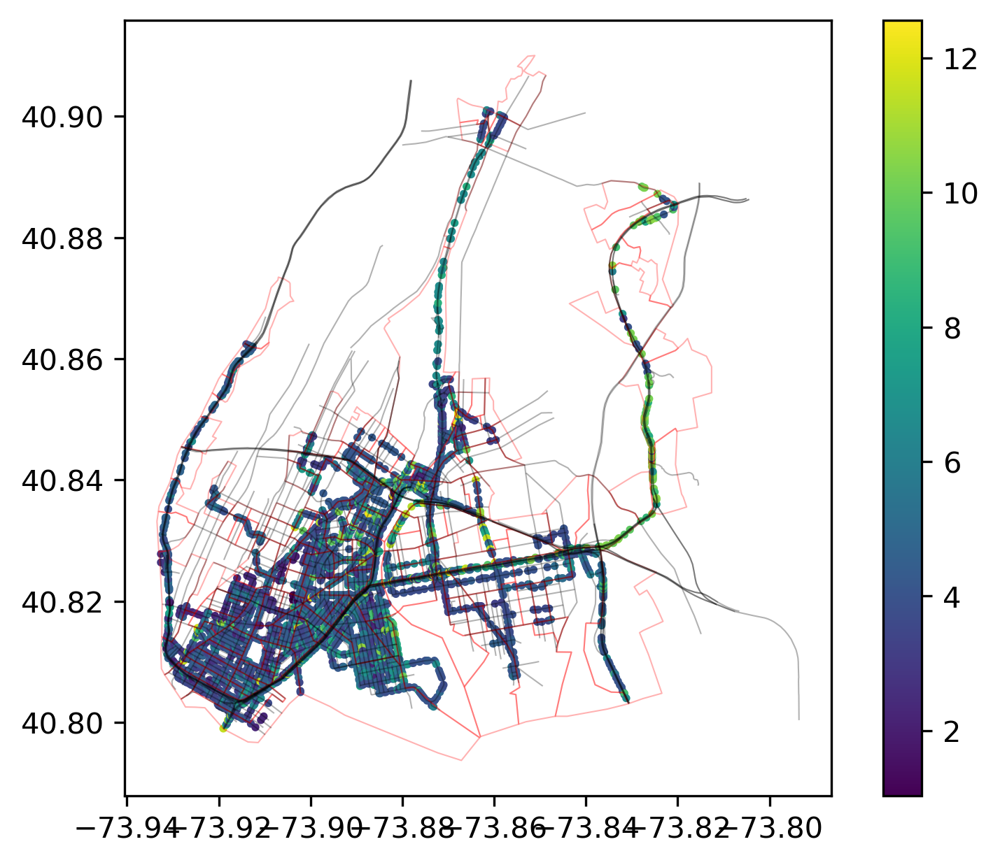

In [14]:
display(pts)
fig, ax = plt.subplots()
tracts.boundary.plot(edgecolor="red", linewidth=0.5, alpha=0.3, ax=ax)
roads.plot(color="black", linewidth=0.5, alpha=0.3, ax=ax)
pts.plot("pm25", legend=True, markersize=3, ax=ax)

Text(0.5, 1.0, 'Count of points per road')

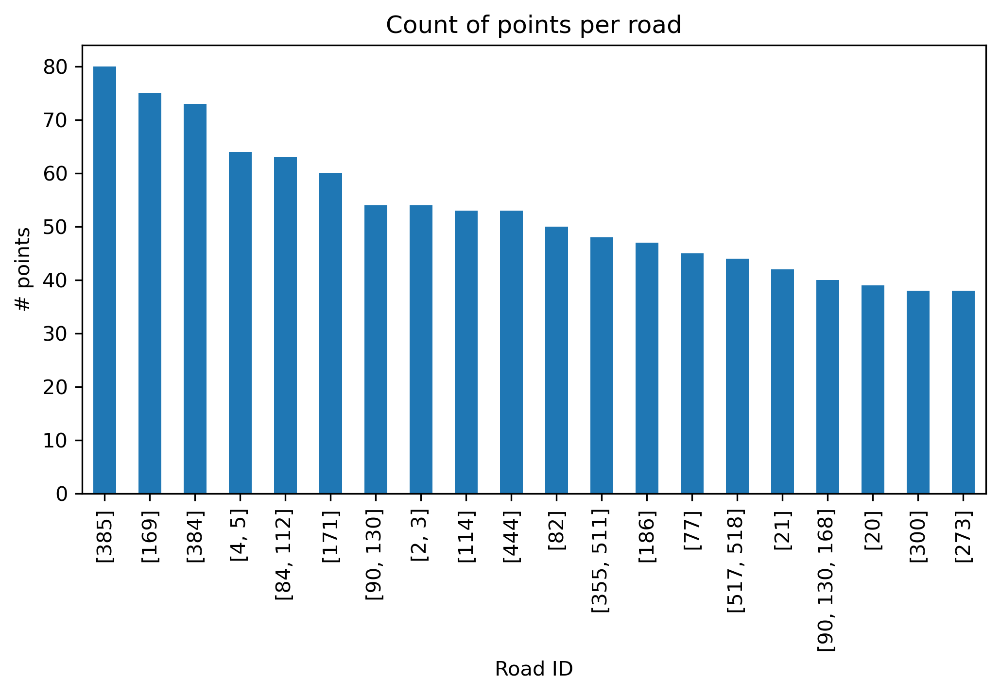

In [15]:
fig, ax = plt.subplots(figsize=[8, 4])
pts.road.value_counts().iloc[:20].plot(kind="bar", ax=ax)
plt.xlabel("Road ID")
plt.ylabel("# points")
plt.title("Count of points per road")


In [16]:
# Step 1: Define your area of interest
place_name = "Bronx, New York, USA"

# Step 2: Download list of restaurants and schools
tags = {"amenity": ["restaurant", "school"]}
amenities = ox.geometries_from_place(place_name, tags)
ox_net = ox.graph_from_place(place_name, network_type="all")
# Convert the graph to a GeoDataFrame
ox_net_nodes, ox_net_edges = ox.graph_to_gdfs(ox_net)

ox_net_edges = ox_net_edges.to_crs(mercator)
ox_net_nodes = ox_net_nodes.to_crs(mercator)

# Step 3: Separate restaurants and schools into different GeoDataFrames
restaurants = amenities[amenities["amenity"] == "restaurant"].loc['node']
schools = amenities[amenities["amenity"] == "school"].loc['node']


display("### Restaurants ###")
display(restaurants)
display("### Schools ###")
display(schools)

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is 

'### Restaurants ###'

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will r

,amenity,ele,gnis:feature_id,name,wikidata,geometry,addr:city,addr:housenumber,addr:postcode,addr:state,...,drive_through,leisure,dog,drinking_water,fee,wikipedia,landuse,electrified,operator:short,operator:wikipedia
osmid,,,,,,,,,,,,,,,,,,,,,
2027166578,restaurant,NaN,NaN,Riverdale Steak House,NaN,POINT (-73.90388 40.90671),Bronx,5700,10471,NY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2027166857,restaurant,NaN,NaN,Greentree,NaN,POINT (-73.90435 40.90678),Bronx,NaN,10471,NY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2526675255,restaurant,NaN,NaN,Golden Krust,NaN,POINT (-73.83110 40.88855),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2527349400,restaurant,NaN,NaN,Kennedy Fried Chicken,NaN,POINT (-73.83114 40.88845),Bronx,3016,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2527363594,restaurant,NaN,NaN,Xinglung Best Chinese Food Eat-in and Takeout,NaN,POINT (-73.83113 40.88903),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11196397192,restaurant,NaN,NaN,El Crucero,NaN,POINT (-73.92458 40.81001),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11769036134,restaurant,NaN,NaN,Golden Eagle Diner,NaN,POINT (-73.85703 40.84793),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11863319956,restaurant,NaN,NaN,China Pavilion,NaN,POINT (-73.84375 40.85627),Bronx,2102,10461,NY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'### Schools ###'

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future v

,amenity,ele,gnis:feature_id,name,wikidata,geometry,addr:city,addr:housenumber,addr:postcode,addr:state,...,drive_through,leisure,dog,drinking_water,fee,wikipedia,landuse,electrified,operator:short,operator:wikipedia
osmid,,,,,,,,,,,,,,,,,,,,,
357544551,school,20,942326,All Hallows School,Q4728797,POINT (-73.92175 40.83045),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
357556824,school,8,948528,Dodge Vocational High School,NaN,POINT (-73.91153 40.81788),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
357557995,school,4,949441,Intermediate School 131,NaN,POINT (-73.86019 40.82351),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
357559473,school,64,950028,Fieldston Upper School,NaN,POINT (-73.90698 40.88920),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
357561857,school,9,951306,Gompers Vocational High School,NaN,POINT (-73.90764 40.81038),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9520886036,school,NaN,NaN,South Bronx Classical III,NaN,POINT (-73.90636 40.82948),New York,3458,10456,NY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9846981548,school,NaN,NaN,P.S. 168,NaN,POINT (-73.89039 40.88359),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10119327874,school,NaN,NaN,IS 254,NaN,POINT (-73.88966 40.85908),NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Separate point features matrix

In [17]:
# Make bufferes point data
buffer_distance1 = 300  # Buffer distance in meters
buffer_distance2 = 100  # Buffer distance in meters
buffered_pts_geom1 = pts.to_crs(mercator).buffer(buffer_distance1)
buffered_pts_geom2 = pts.to_crs(mercator).buffer(buffer_distance2)
buffered_pts = pts.to_crs(mercator).copy()
buffered_pts["buffer1"] = buffered_pts_geom1
buffered_pts["buffer2"] = buffered_pts_geom2

# Reproject to a projected coordinate system for accurate area calculations
restaurants = restaurants.to_crs(mercator)
schools = schools.to_crs(mercator)

C1 = buffer_distance1**2 * np.pi
C2 = buffer_distance2**2 * np.pi

# Calculate the proximity to the nearest school
def calculate_nearest_school_distance(point):
    distances = schools.geometry.distance(point) / 1e3  # in kilometers
    return distances.min()

# Function to calculate road and intersection density within a buffer
def calculate_densities(buffer, edges=ox_net_edges, nodes=ox_net_nodes):
    # Clip edges and nodes to the buffer
    clipped_edges = edges[edges.intersects(buffer)]
    clipped_nodes = nodes[nodes.intersects(buffer)]

    # Calculate road length and area
    road_length_km = clipped_edges["length"].sum() / 1e3  # in kilometers

    # Calculate intersection count
    intersection_count = len(clipped_nodes)

    # Calculate densities
    road_density = road_length_km / C2
    intersection_density = intersection_count / C2

    return road_density, intersection_density


restaurant_density = []
school_distance = []
road_density = []
intersection_density = []
for ix, row in tqdm(buffered_pts.iterrows(), total=len(buffered_pts)):
    restaurant_density.append(1000 * restaurants.intersects(row.buffer1).sum() / C1)
    school_distance.append(calculate_nearest_school_distance(row.geometry))
    rd, id = calculate_densities(row.buffer2)
    road_density.append(rd)
    intersection_density.append(id)

pts["restaurant_density"] = restaurant_density
pts["nearest_school_distance"] = school_distance
pts["road_density"] = road_density
pts["intersection_density"] = intersection_density

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

  0%|          | 0/3946 [00:00<?, ?it/s]

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  w

Separate point features matrix

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame 

,lon,lat,pm25,pm25_q10,pm25_q90,time_of_day,geometry,road,tract,restaurant_density,nearest_school_distance,road_density,intersection_density
8199,-73.8882,40.8266,3.288390,3.282128,6.319406,11.183333,POINT (-73.88820 40.82660),[114],"[66, 73]",0.000000,0.558591,0.000050,0.000095
8201,-73.8882,40.8288,4.348238,4.348238,4.348238,13.200000,POINT (-73.88820 40.82880),"[273, 226]",[76],0.000000,0.673612,0.000043,0.000223
8207,-73.8882,40.8330,10.109027,3.983952,10.122329,14.033333,POINT (-73.88820 40.83300),[289],[78],0.000000,0.383996,0.000071,0.000191
8214,-73.8882,40.8366,4.366279,4.183322,4.610648,14.966667,POINT (-73.88820 40.83660),[169],"[71, 81]",0.003537,0.172295,0.000074,0.000159
8218,-73.8882,40.8398,3.763369,3.763369,3.763369,14.766667,POINT (-73.88820 40.83980),[305],"[72, 60]",0.000000,0.625830,0.000135,0.000828
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8183,-73.8882,40.8178,3.087006,3.070325,3.109214,9.716667,POINT (-73.88820 40.81780),[302],[77],0.000000,0.386097,0.000071,0.000318
8186,-73.8882,40.8204,5.729451,5.729057,10.516564,12.183333,POINT (-73.88820 40.82040),[246],[77],0.000000,0.680238,0.000093,0.000382
8187,-73.8882,40.8206,5.471461,3.177321,5.938519,10.750000,POINT (-73.88820 40.82060),[304],[77],0.000000,0.706377,0.000102,0.000382
8189,-73.8882,40.8214,10.635258,4.364834,11.713342,15.650000,POINT (-73.88820 40.82140),[287],[77],0.000000,0.813179,0.000162,0.000414


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geoseries.py:221: DeprecationWarning: Passing a SingleBlockManager to GeoSeries is deprecated and will raise in a future version. Use public APIs instead.
  super().__init__(data, index=index, name=name, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geoseries.py:221: DeprecationWarning: Passing a Sing

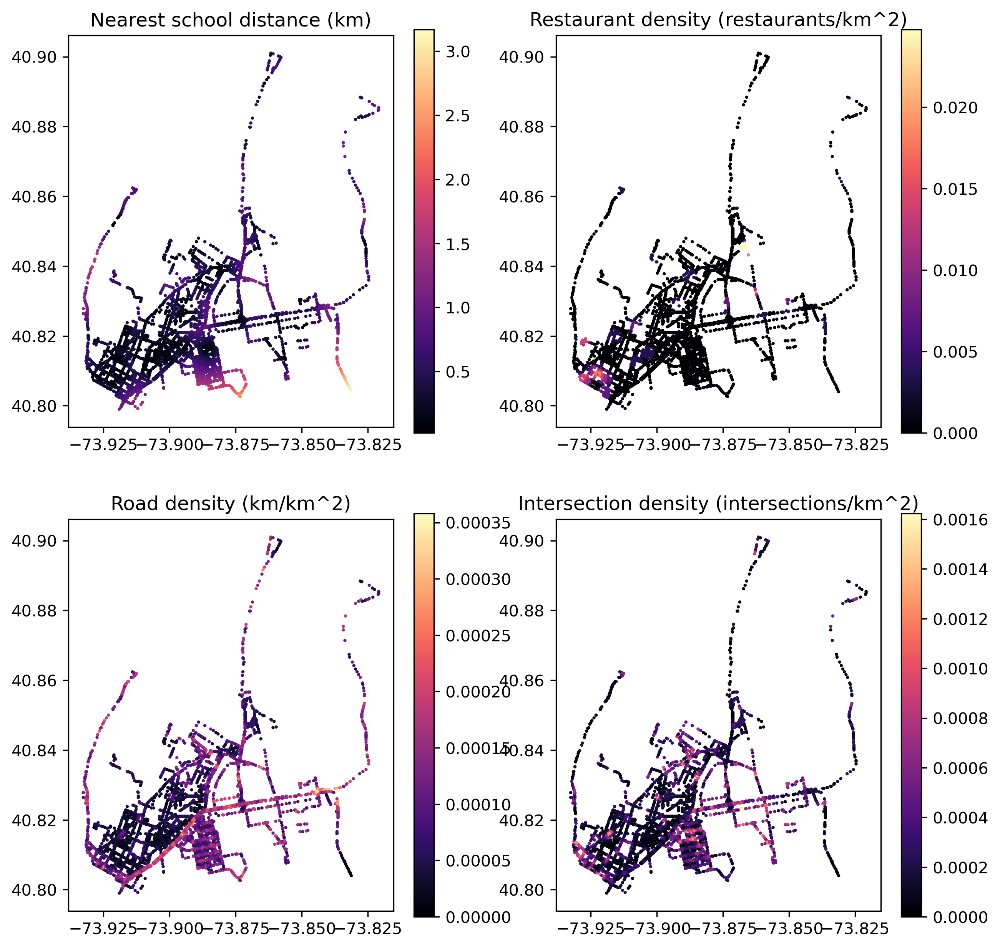

In [18]:
display(pts)
fig, ax = plt.subplots(2, 2, figsize=[10, 10])
pts.plot("nearest_school_distance", legend=True, ax=ax[0, 0], markersize=1, cmap="magma")
pts.plot("restaurant_density", legend=True, ax=ax[0, 1], markersize=1, cmap="magma")
pts.plot("road_density", legend=True, ax=ax[1, 0], markersize=1, cmap="magma")
pts.plot("intersection_density", legend=True, ax=ax[1, 1], markersize=1, cmap="magma")
ax[0, 0].set_title("Nearest school distance (km)")
ax[0, 1].set_title("Restaurant density (restaurants/km^2)")
ax[1, 0].set_title("Road density (km/km^2)")
ax[1, 1].set_title("Intersection density (intersections/km^2)")

# save the figure
fig.savefig("notebooks/diagfigs/point_features.png")

# save also every axis
for i, a in enumerate(ax.flat):
    a.get_figure().savefig(f"notebooks/diagfigs/point_features_{i}.png")

In [19]:
pts.columns

Index(['lon', 'lat', 'pm25', 'pm25_q10', 'pm25_q90', 'time_of_day', 'geometry',
       'road', 'tract', 'restaurant_density', 'nearest_school_distance',
       'road_density', 'intersection_density'],
      dtype='object')

In [20]:
pts_feats = pts.copy()
# make pts_deats a matrix of zeros with one column
# pts_feats = pts[["road", "tract", "lon", "lat", "geometry", "pm25"]]
pts_feats["placeholder"] = 0
# compute time as fraction of day
# pts_feats["weekday"] = pts_feats.time.dt.weekday
# pts_feats["time_of_day"] =( pts_feats.time.dt.hour + pts_feats.time.dt.minute / 60) / 24
# time from hour to fraction of day
# pts_feats["time"] = [t.hour + t.minute / 60 for t in pts_feats.time]
y = pts_feats[["pm25", "pm25_q10", "pm25_q90", "geometry"]]
pts_feats = pts_feats.drop(
    columns=[
        "road",
        "tract",
        "lon",
        "lat",
        # "road_density",
        # "intersection_density",
        "placeholder",
        "pm25",
        "pm25_q10",
        "pm25_q90",
        # "time_of_day"
    ]
)
display(pts_feats)
# replace weekday with one-hot encoding
# pts_feats = pd.get_dummies(pts_feats, columns=["weekday"], drop_first=True)

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

,time_of_day,geometry,restaurant_density,nearest_school_distance,road_density,intersection_density
8199,11.183333,POINT (-73.88820 40.82660),0.000000,0.558591,0.000050,0.000095
8201,13.200000,POINT (-73.88820 40.82880),0.000000,0.673612,0.000043,0.000223
8207,14.033333,POINT (-73.88820 40.83300),0.000000,0.383996,0.000071,0.000191
8214,14.966667,POINT (-73.88820 40.83660),0.003537,0.172295,0.000074,0.000159
8218,14.766667,POINT (-73.88820 40.83980),0.000000,0.625830,0.000135,0.000828
...,...,...,...,...,...,...
8183,9.716667,POINT (-73.88820 40.81780),0.000000,0.386097,0.000071,0.000318
8186,12.183333,POINT (-73.88820 40.82040),0.000000,0.680238,0.000093,0.000382
8187,10.750000,POINT (-73.88820 40.82060),0.000000,0.706377,0.000102,0.000382
8189,15.650000,POINT (-73.88820 40.82140),0.000000,0.813179,0.000162,0.000414


Labels=y at the rank 0 level

In [21]:
display(y)

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

,pm25,pm25_q10,pm25_q90,geometry
8199,3.288390,3.282128,6.319406,POINT (-73.88820 40.82660)
8201,4.348238,4.348238,4.348238,POINT (-73.88820 40.82880)
8207,10.109027,3.983952,10.122329,POINT (-73.88820 40.83300)
8214,4.366279,4.183322,4.610648,POINT (-73.88820 40.83660)
8218,3.763369,3.763369,3.763369,POINT (-73.88820 40.83980)
...,...,...,...,...
8183,3.087006,3.070325,3.109214,POINT (-73.88820 40.81780)
8186,5.729451,5.729057,10.516564,POINT (-73.88820 40.82040)
8187,5.471461,3.177321,5.938519,POINT (-73.88820 40.82060)
8189,10.635258,4.364834,11.713342,POINT (-73.88820 40.82140)


### Road traffic level features

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geoseries.py:221: DeprecationWarning: Passing a SingleBlockManager to GeoSeries is deprecated and will raise in a future version. Use public APIs instead.
  super().__init__(data, index=index, name=name, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geoseries.py:221: DeprecationWarning: Passing a Sing

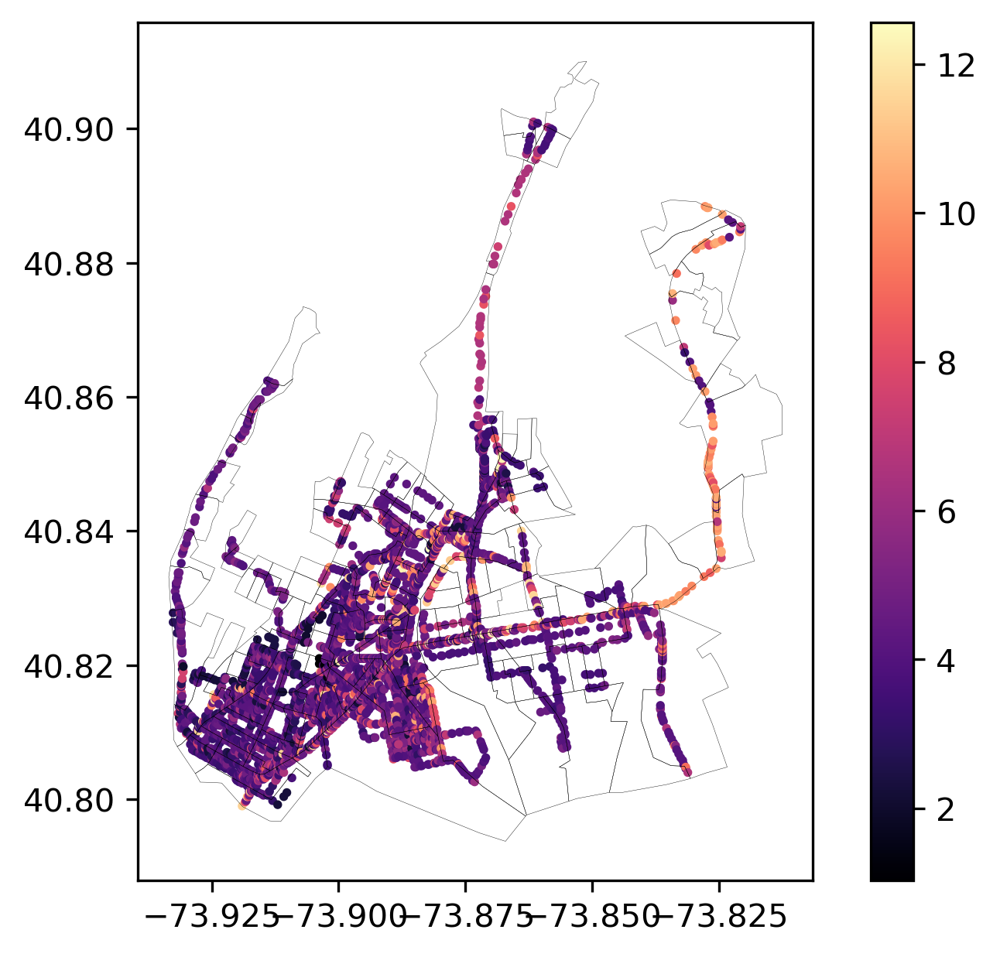

In [22]:
ax = pts.plot("pm25", legend=True, markersize=3, cmap="magma")
# add road for reference
tracts.boundary.plot(color="black", lw=0.1, ax=ax)
plt.savefig("notebooks/diagfigs/pm25_points.png")

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame 

Columns: id, name, desc, county, route, fromMile, toMile, fc, latitude, longitude, AADT_2022, AAWDT_2022, PCT_2022, AADT_2021, AAWDT_2021, PCT_2021, AADT_2020, AAWDT_2020, PCT_2020, AADT_2019, AAWDT_2019, PCT_2019, AADT_2018, AAWDT_2018, PCT_2018, AADT_2017, AAWDT_2017, PCT_2017, AADT_2016, AAWDT_2016, PCT_2016, AADT_2015, AAWDT_2015, PCT_2015, AADT_2014, AAWDT_2014, PCT_2014, AADT_2013, AAWDT_2013, PCT_2013, geometry


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)


,id,name,desc,county,route,fromMile,toMile,fc,latitude,longitude,...,AADT_2015,AAWDT_2015,PCT_2015,AADT_2014,AAWDT_2014,PCT_2014,AADT_2013,AAWDT_2013,PCT_2013,geometry
0,010001000000,010001,I-95 from NY/Bronx Co Line to I-87 MAJ DEEGAN ...,Bronx,ALEXANDER HAMIL,0,0.07,Urban:Principal Arterial - Interstate,40.844940,-73.926880,...,None,None,None,None,None,None,None,None,None,POINT (-73.92688 40.84494)
1,010002000000,010002,I-95 from I-87 MAJ DEEGAN EXP UNDER to MACOMBS...,Bronx,CROSS BRONX EXP,0.07,0.58,Urban:Principal Arterial - Interstate,40.844880,-73.920390,...,"99,399",None,9.1%,"102,658",None,9.3%,"106,024",None,9.2%,POINT (-73.92039 40.84488)
2,010003000000,0191,239 FT West of Jerome Ave,None,None,None,None,LU:Principal Arterial - Interstate,40.845008,-73.915372,...,"153,360",None,14.8%,"162,758",None,14.8%,"154,510",None,14.8%,POINT (-73.91537 40.84501)
3,01000300000R,0199 (RETIRED),I-95 from MACOMBS RD OVER to END I-95/US1 OLAP,Bronx,CROSS BRONX EXP,0.58,1.21,Urban:Principal Arterial - Interstate,40.844841,-73.906159,...,"153,360",None,14.8%,"162,758","143,311",14.8%,None,None,None,POINT (-73.90616 40.84484)
4,010004000000,010004,US1 from END I-95/US1 OLAP,Bronx,WEBSTER AVE,1.21,2.71,Urban:Principal Arterial - Other,40.853662,-73.897180,...,"17,188","18,288",6.1%,None,None,None,None,None,None,POINT (-73.89718 40.85366)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55815,978034000000,978034,CR43 GOODRICH RD from NY 17C to GLEN MARY DR,Tioga,GOODRICH RD,0,0.53,Urban:Local,42.101200,-76.287090,...,"1,681",None,5.6%,"1,700",None,5.6%,"1,718","2,040",5.5%,POINT (-76.28709 42.10120)
55816,978036000000,978036,CR17 BERRY ROAD from HUNTS CREEK RD RD to STAN...,Tioga,BERRY ROAD,0,0.77,Urban:Local,42.059350,-76.317980,...,573,None,11.0%,579,None,10.9%,586,None,10.9%,POINT (-76.31798 42.05935)
55817,978037000000,978037,N ELLISTOWN RD from BROAD ST EXT to NY 17C,Tioga,N ELLISTOWN RD,0,0.33,Urban:Major Collector,42.006300,-76.507490,...,"1,720",None,7.5%,"1,738","1,749",7.4%,"1,867",None,5.9%,POINT (-76.50749 42.00630)
55818,978501000000,978501,CR3 DEAN CREEK RD from EDGECOMB HILL RD to SPE...,Tioga,DEAN CREEK RD,1.43,4.29,Rural:Local,42.136158,-76.526014,...,None,None,None,None,None,None,None,None,None,POINT (-76.52601 42.13616)


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

Text(0.5, 1.0, 'AADT 2021 in Bronx, NY')

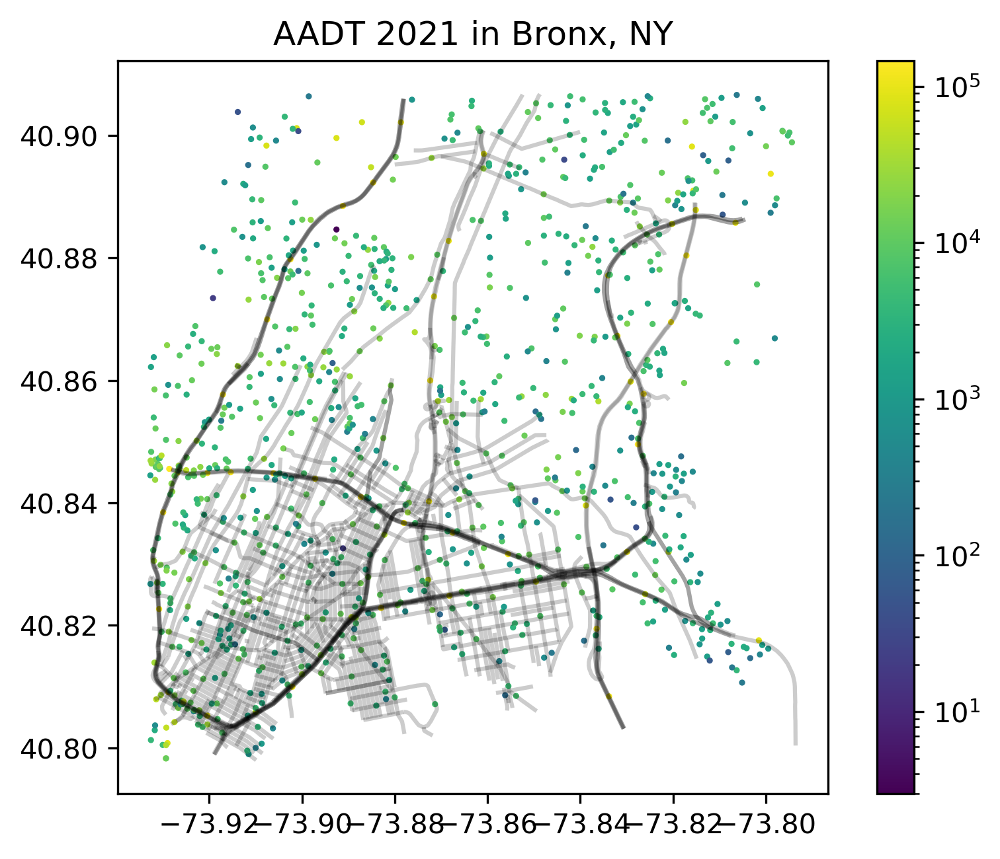

In [23]:
import matplotlib

# load aadt data, crs=2263, used in NYC commonly, convert to WGS84
aadt = gpd.read_file(
    "data/raw/aadt_and_truckpct/features.shp", crs="EPSG:2263"
).to_crs(wgs84)
print("Columns:", ", ".join(aadt.columns))
display(aadt)

# coerce the following vars to numeric, handling comma-separated numbers and % signs
c = ["AADT_2021", "AAWDT_2021", "PCT_2021"]
for col in c:
    aadt[col] = pd.to_numeric(aadt[col].str.replace(",", "").str.replace("%", ""))


# crop to bounds of Bronx
aadt = aadt.cx[
    roads.total_bounds[0] : roads.total_bounds[2],
    roads.total_bounds[1] : roads.total_bounds[3],
]

# plot the points overlay the roads, use log scale
ax = roads.plot(color="black", alpha=0.2)
norm = matplotlib.colors.LogNorm(vmin=aadt.AADT_2021.min(), vmax=aadt.AADT_2021.max())
aadt.plot("AADT_2021", markersize=1.5, ax=ax, legend=True, norm=norm)
plt.title("AADT 2021 in Bronx, NY")

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/sklearn/utils/validation.py:605: DeprecationWarning: is_sparse is deprecated and will 

  0%|          | 0/550 [00:00<?, ?it/s]

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/sklearn/utils/validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/sklearn/utils/validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/c

,AADT_2021,PCT_2021,geometry
1705,4409.386312,8.088976,"LINESTRING (-73.93258 40.82553, -73.93258 40.8..."
1073,22709.848430,5.039142,"LINESTRING (-73.93150 40.83084, -73.93194 40.8..."
1666,35184.018532,6.700589,"LINESTRING (-73.87801 40.90596, -73.87811 40.9..."
2360,35184.018532,6.700589,"LINESTRING (-73.91148 40.80494, -73.91233 40.8..."
592,36078.676727,6.871229,"LINESTRING (-73.87819 40.90598, -73.87829 40.9..."
...,...,...,...
984,5918.407248,5.888441,"LINESTRING (-73.81151 40.81946, -73.81287 40.8..."
1995,9843.202102,6.791141,"LINESTRING (-73.82525 40.83694, -73.82461 40.8..."
999,5286.992145,5.519664,"LINESTRING (-73.82354 40.88565, -73.82418 40.8..."
2744,10614.481415,9.240108,"LINESTRING (-73.82259 40.88594, -73.82278 40.8..."


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

Text(0.5, 1.0, 'Road AADT 2021 in Bronx, NY')

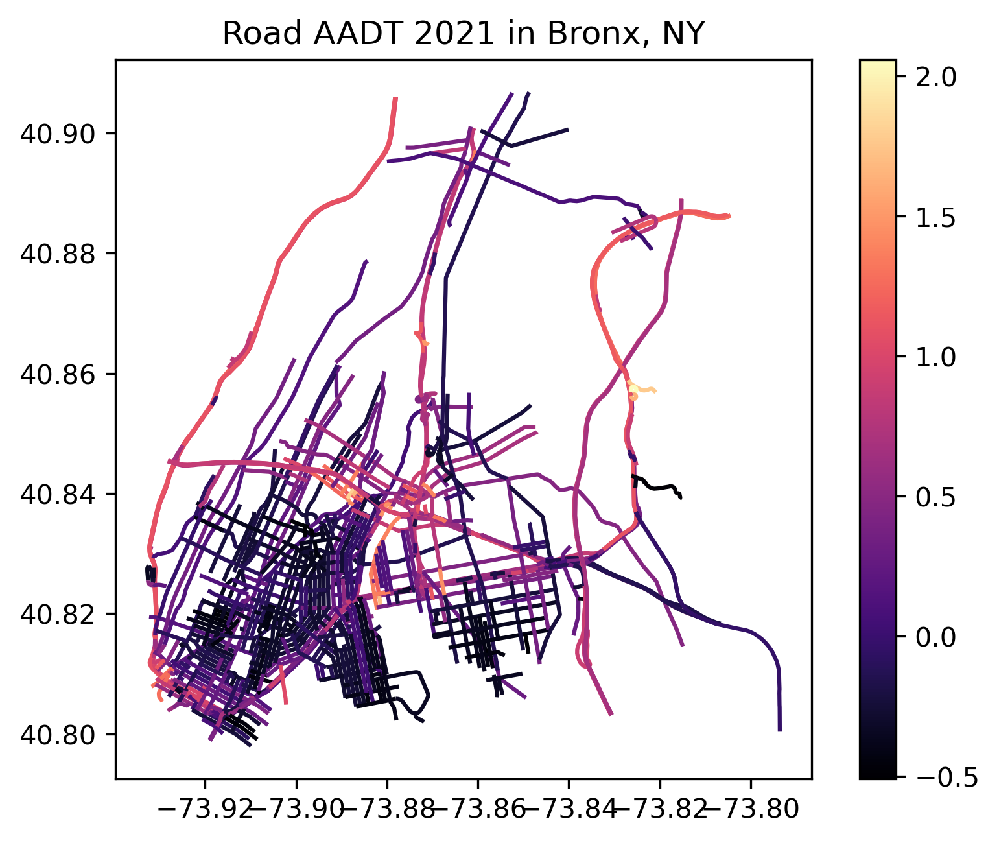

In [24]:
# make a weighted knn predictor
from sklearn.neighbors import KNeighborsRegressor

c = ["AADT_2021", "PCT_2021"]
Y = aadt[c]  # pandas
X = aadt[["longitude", "latitude"]]
knn = KNeighborsRegressor(n_neighbors=3, weights="distance")

# # remove NaNs
nan_ix = Y.isna().any(axis=1)
X = X.loc[~nan_ix]
Y = Y.loc[~nan_ix]

knn.fit(X, Y)

# predict AADT for each road, evaluate on all the points of the line and average
road_feats = []
for ix, row in tqdm(roads.iterrows(), total=roads.shape[0]):
    road = row.geometry
    lon, lat = road.xy
    Xtest = pd.DataFrame({"longitude": lon, "latitude": lat})
    preds = knn.predict(Xtest)
    road_feats.append(preds.mean(axis=0))
road_feats = np.array(road_feats)
road_feats = gpd.GeoDataFrame(
    road_feats, columns=Y.columns, geometry=roads.geometry.values, index=roads.index
)
display(road_feats)

# apply the scaled symlog transform
def scaled_symlog(x):
    m = x.median()
    iqr = np.percentile(x, 75) - np.percentile(x, 25)
    x_scaled = (x - m) / iqr
    return np.sign(x_scaled) * np.log1p(np.abs(x_scaled))


# norm = matplotlib.colors.LogNorm(vmin=roads.AADT_2019.min(), vmax=roads.AADT_2019.max())
road_feats_ = road_feats.copy()
road_feats_["AADT_2021"] = scaled_symlog(road_feats["AADT_2021"])
road_feats_.plot("AADT_2021", legend=True, cmap="magma")
plt.savefig("notebooks/diagfigs/road_feats.png")
plt.title("Road AADT 2021 in Bronx, NY")

### Features by census tracts from NYC zoning

In [25]:
from copy import deepcopy
tracts_backup = deepcopy(tracts)
tracts = deepcopy(tracts_backup)
tracts

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

,STATEFP,COUNTYFP,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,LSAD,ALAND,AWATER,geometry,coarse_pm25
TRACTCE,,,,,,,,,,,,,,
6301,36,005,1400000US36005006301,36005006301,63.01,Census Tract 63.01,NY,Bronx County,New York,CT,782166,9963,"POLYGON ((-73.93306 40.82816, -73.93146 40.828...",6.955000
18900,36,005,1400000US36005018900,36005018900,189,Census Tract 189,NY,Bronx County,New York,CT,355570,0,"POLYGON ((-73.93314 40.83481, -73.93035 40.834...",7.175000
5100,36,005,1400000US36005005100,36005005100,51,Census Tract 51,NY,Bronx County,New York,CT,510445,0,"POLYGON ((-73.93260 40.81152, -73.93240 40.814...",6.850000
19300,36,005,1400000US36005019300,36005019300,193,Census Tract 193,NY,Bronx County,New York,CT,241287,0,"POLYGON ((-73.93301 40.83568, -73.93061 40.839...",7.300000
1901,36,005,1400000US36005001901,36005001901,19.01,Census Tract 19.01,NY,Bronx County,New York,CT,205007,0,"POLYGON ((-73.93094 40.80825, -73.92933 40.809...",6.662500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30201,36,005,1400000US36005030201,36005030201,302.01,Census Tract 302.01,NY,Bronx County,New York,CT,221595,0,"POLYGON ((-73.82826 40.86085, -73.82642 40.863...",7.200000
48401,36,005,1400000US36005048401,36005048401,484.01,Census Tract 484.01,NY,Bronx County,New York,CT,504791,0,"POLYGON ((-73.84044 40.88473, -73.83773 40.885...",7.475000
27600,36,005,1400000US36005027600,36005027600,276,Census Tract 276,NY,Bronx County,New York,CT,1837997,499778,"POLYGON ((-73.83282 40.85612, -73.83199 40.856...",7.189285


Columns: borough, tax_block, lot, cd, tract, block, ct2010, cb2010, schooldist, council, zipcode, firecomp, policeprct, healthcenterdistrict, healtharea, sanitboro, sanitdistrict, sanitsub, address, zonedist1, zonedist2, zonedist3, zonedist4, overlay1, overlay2, spdist1, spdist2, spdist3, ltdheight, splitzone, bldgclass, landuse, easements, ownertype, ownername, lotarea, bldgarea, comarea, resarea, officearea, retailarea, garagearea, strgearea, factryarea, otherarea, areasource, numbldgs, numfloors, unitsres, unitstotal, lotfront, lotdepth, bldgfront, bldgdepth, ext, proxcode, irrlotcode, lottype, bsmtcode, assessland, assesstot, exempttot, yearbuilt, yearalter1, yearalter2, histdist, landmark, builtfar, residfar, commfar, facilfar, borocode, bbl, condono, tract2010, xcoord, ycoord, zonemap, zmcode, sanborn, taxmap, edesignum, appbbl, appdate, plutomapid, firm07_flag, pfirm15_flag, version, dcpedited, latitude, longitude, notes


,borough,tax_block,lot,cd,tract,block,ct2010,cb2010,schooldist,council,...,appbbl,appdate,plutomapid,firm07_flag,pfirm15_flag,version,dcpedited,latitude,longitude,notes
8,BX,3032,129,206.0,38304,1001,383.02,1001.0,10.0,15.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.860247,-73.892348,NaN
9,BX,2956,2,206.0,36502,2000,365.02,2000.0,12.0,15.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.843836,-73.889176,NaN
11,BX,5413,81,210.0,27401,2001,274.01,2001.0,8.0,13.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.846491,-73.821691,NaN
12,BX,5413,9,210.0,27401,1000,274.01,1000.0,8.0,13.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.847164,-73.822513,NaN
13,BX,5413,128,210.0,27401,2000,274.01,2000.0,8.0,13.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.847480,-73.820459,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
858391,BX,3832,10,209.0,9600,1000,96.00,1000.0,8.0,18.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.834433,-73.848158,NaN
858417,BX,2391,45,203.0,14300,1007,143.00,1016.0,9.0,16.0,...,2.023910e+09,11/16/2009,1,NaN,NaN,24v1.1,NaN,40.827105,-73.912030,NaN
858418,BX,5744,48,208.0,29301,2000,293.01,2000.0,10.0,11.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.881780,-73.920658,NaN
858537,BX,5406,67,210.0,27401,3010,274.01,3009.0,8.0,13.0,...,NaN,NaN,1,NaN,NaN,24v1.1,NaN,40.839107,-73.823196,NaN


/var/folders/h3/2f91vbwj7r506n1w06610njh0000gn/T/ipykernel_57832/1270968734.py:85: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'one_two_family' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[df.landuse.isin(classes), "landuse"] = new_class


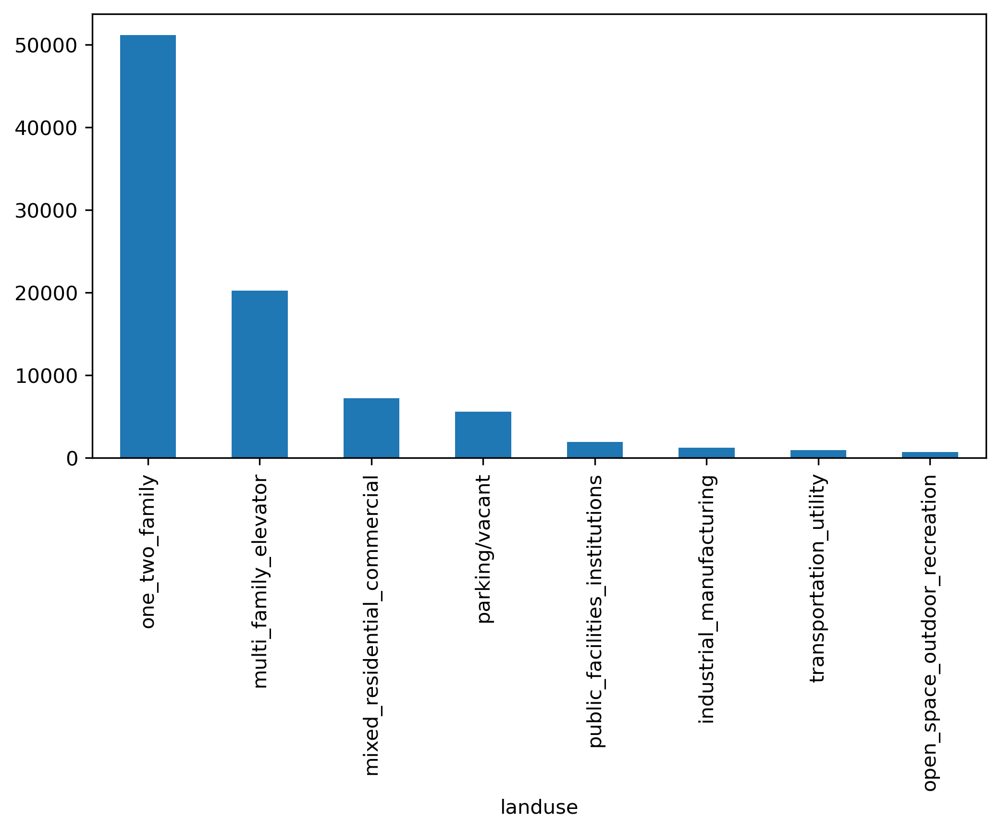

New dummy columns: landuse_mixed_residential_commercial, landuse_multi_family_elevator, landuse_one_two_family, landuse_open_space_outdoor_recreation, landuse_parking/vacant, landuse_public_facilities_institutions, landuse_transportation_utility
Columns: bldgarea, comarea, resarea, officearea, retailarea, factryarea, landuse_mixed_residential_commercial, landuse_multi_family_elevator, landuse_one_two_family, landuse_open_space_outdoor_recreation, landuse_parking/vacant, landuse_public_facilities_institutions, landuse_transportation_utility, lotarea, assesstot, lotfront, lotdepth


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geoseries.py:221: DeprecationWarning: Passing a SingleBlockManager to GeoSe

,id,bldgarea,comarea,resarea,officearea,retailarea,factryarea,landuse_mixed_residential_commercial,landuse_multi_family_elevator,landuse_one_two_family,landuse_open_space_outdoor_recreation,landuse_parking/vacant,landuse_public_facilities_institutions,landuse_transportation_utility,lotarea,assesstot,lotfront,lotdepth,geometry,coarse_pm25
0,200,0.266297,0.014688,0.230103,0.000223,0.004151,0.002596,0.000006,0.000048,0.000329,0.000009,0.000664,0.000015,0.000000,0.583213,0.000214,0.339109,0.434072,"POLYGON ((-73.86648 40.80590, -73.86222 40.810...",6.85625
1,400,0.264036,0.014356,0.235935,0.000527,0.003073,0.000000,0.000011,0.000258,0.000240,0.000458,0.000255,0.000015,0.000002,0.849728,0.008111,0.410327,0.761597,"POLYGON ((-73.85870 40.81540, -73.85778 40.815...",6.87000
2,1600,1.069532,0.438426,0.601089,0.081915,0.018124,0.000000,0.000272,0.000323,0.000456,0.000478,0.000398,0.000718,0.000000,0.333306,0.032768,0.888606,0.890461,"POLYGON ((-73.86246 40.81925, -73.86153 40.819...",6.93750
3,1901,3.812645,0.911818,2.854734,0.216406,0.230910,0.056124,0.006307,0.001442,0.000000,0.000000,0.001818,0.000550,0.000204,0.069696,0.181801,2.123340,2.481584,"POLYGON ((-73.93094 40.80825, -73.92933 40.809...",6.66250
4,1902,1.425532,0.997668,0.346947,0.081079,0.031895,0.537697,0.000348,0.000138,0.000164,0.000184,0.000204,0.000065,0.000541,0.226121,0.004670,0.469884,0.557185,"POLYGON ((-73.92446 40.80689, -73.92426 40.807...",6.86000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,46203,0.426216,0.339647,0.078076,0.067065,0.042594,0.009948,0.001818,0.000086,0.000186,0.000415,0.005501,0.001363,0.000326,0.343966,0.049658,4.984768,3.189251,"POLYGON ((-73.83245 40.88022, -73.83144 40.881...",7.29375
147,46205,0.659798,0.659798,0.000000,0.197960,0.245396,0.001415,0.014224,0.000000,0.000000,0.000230,0.002421,0.010903,0.000000,0.656787,1.857310,16.562153,15.162593,"POLYGON ((-73.83488 40.87550, -73.83444 40.874...",7.27500
148,46207,1.902246,1.902246,0.000000,0.000000,0.848956,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026264,27.613800,278.330000,676.000000,"POLYGON ((-73.83450 40.87723, -73.83400 40.878...",7.37500
149,46209,0.655938,0.287899,0.348172,0.018474,0.050552,0.048227,0.000467,0.001019,0.000314,0.000000,0.000468,0.000105,0.000709,0.316518,0.011394,0.886363,1.003565,"POLYGON ((-73.83874 40.88127, -73.83664 40.882...",7.38500


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

Text(0.5, 1.0, 'Retailarea in Bronx, NY')

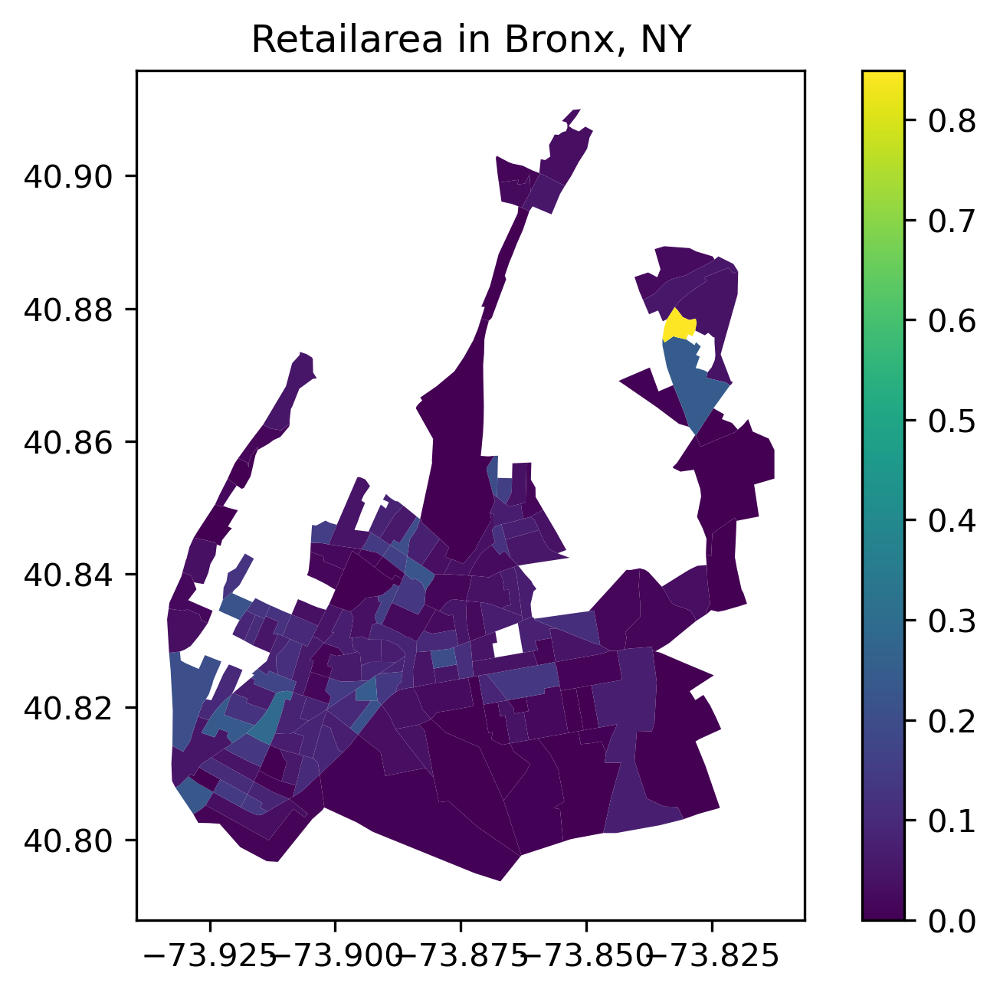

In [26]:
import re

# Primary Land Use Tax Lot Output (PLUTO)
# crs=2263, used in NYC commonly, convert to WGS84
df = pd.read_csv("data/raw/nyc_pluto_24v1_1_csv/pluto_24v1_1.csv", low_memory=False)
df.rename(columns={"block": "tax_block"}, inplace=True)
df.rename(columns={"bctcb2020": "block"}, inplace=True)
df.rename(columns={"bct2020": "tract"}, inplace=True)
print("Columns:", ", ".join(df.columns))

# remove NaNs from bctcb2020zw
df = df[df.borough == "BX"]

# process as string and keep only last 4 digits
df = df[df.block.notna() & df.landuse.notna()]
df["block"] = df["block"].astype(int).astype(str).str[-4:].astype(int)
df["tract"] = df["tract"].astype(int).astype(str).str[-6:].astype(int)
display(df)

# transform assesstot to millions of dollar
df["assesstot"] = df["assesstot"] / 1e6

# categorical variables to be made one-hot and summed
# cat_cols = ["bldgclass", "landuse"]
cat_cols = ["landuse"]


# # preprocess building class
# # see pluto data dictionary
# mapping = [
#     (["R5", "R7", "R8", "RA", "RB", "RH", "RK", "RD"], "residential"),
#     (["R1", "R2", "R3", "R4", "R6", "RR", "RC"], "commercial"),
#     (["R9", "RM"], "residential/commercial"),
#     (["RI", "RW"], "industrial/warehouse"),
#     (["RZ"], "residential/industrial"),
#     (["RG", "RP", "RS", "RT"], "parking/storage/terraces"),
# ]

# # map classes
# for classes, new_class in mapping:
#     df.loc[df.bldgclass.isin(classes), "bldgclass"] = new_class

# for the rest, remove the number, just keep the lettter
# new_vals = []
# for ix, row in tqdm(df.iterrows(), total=df.shape[0]):
#     val = row.bldgclass
#     if val not in [x[1] for x in mapping]:
#         val = re.sub(r"[0-9]", "", val)
#     new_vals.append(val)
# df["bldgclass"] = new_vals

# make all classes that appear less than 100 times as "other"
# cnts = df.bldgclass.value_counts()
# df.loc[df.bldgclass.isin(cnts[cnts < 100].index), "bldgclass"] = "other"

# display counts
# display(df.bldgclass.value_counts())
# plt.figure(figsize=(8, 4))
# df.bldgclass.value_counts().plot(kind="bar")
# plt.show()

area_feats = [
    "bldgarea",
    "comarea",
    "resarea",
    "officearea",
    "retailarea",
    "factryarea",
]

# map land use
mapping = [
    ([1], "one_two_family"),
    ([2, 3], "multi_family_elevator"),
    ([4, 5], "mixed_residential_commercial"),
    # ([5], "commercial_office"),
    ([6], "industrial_manufacturing"),
    ([7], "transportation_utility"),
    ([8], "public_facilities_institutions"),
    ([9], "open_space_outdoor_recreation"),
    ([10, 11], "parking/vacant"),
]
df["landuse"] = df["landuse"].astype(int)
for classes, new_class in mapping:
    df.loc[df.landuse.isin(classes), "landuse"] = new_class

# display counts
plt.figure(figsize=(8, 4))
df.landuse.value_counts().plot(kind="bar")
plt.show()

# features to be averaged by LotArea
av_feats = ["assesstot", "lotfront", "lotdepth"]
# av_feats = []

#  drop some columns
# df = df.drop(columns=["bldgclass"])

orig_cols = df.columns
df = pd.get_dummies(df, columns=cat_cols, drop_first=True, prefix=cat_cols)
new_cat_cols = list(df.columns.difference(orig_cols))
print("New dummy columns:", ", ".join(new_cat_cols))

# do groupby, start with sum
dfagg = df.groupby(["tract"])[
    area_feats + new_cat_cols + ["lotarea"]
].sum()


# now compute an weighted average of av_feats by LotArea
def nan_weighted_mean(x, wts):
    isna = np.isnan(x) | np.isnan(wts)
    x = x[~isna]
    wts = wts[~isna] + 1e-6
    return np.nanmean(x * wts) / np.nansum(wts)


for col in av_feats + new_cat_cols:
    dfagg[col] = df.groupby("tract")[[col, "lotarea"]].apply(
        lambda x: nan_weighted_mean(x[col].values, x.lotarea.values)
    )


# transform the count and area features to density and pcts respectively by dividing by lotarea
for col in area_feats:
    dfagg[col] = dfagg[col] / dfagg["lotarea"]

# transform lot area from squared feed to squared kilometers
dfagg["lotarea"] = dfagg["lotarea"] * 0.000000092903

# remove nans
dfagg = dfagg.dropna()
print("Columns:", ", ".join(dfagg.columns))

# find the elements in dfagg.index that are also in tracts.TRACTCE
indexes = dfagg.index[dfagg.index.isin(tracts.index)]
dfagg = dfagg.loc[indexes]
tracts = tracts.loc[indexes]

# convert to gpd
tract_feats = gpd.GeoDataFrame(
    dfagg, geometry=tracts.geometry.loc[dfagg.index], crs=tracts.crs, index=dfagg.index
)
tract_feats["coarse_pm25"] = tracts.coarse_pm25.loc[tract_feats.index.values].values
tract_feats = tract_feats.reset_index()
tract_feats = tract_feats.rename({"tract": "id"}, axis=1)
display(tract_feats)

# plot features as an example
# bldgdepth
tract_feats_ = tract_feats.copy()
# tract_feats_["retailarea"] = scaled_symlog(tract_feats_["retailarea"])
tract_feats_.plot("retailarea", legend=True)
plt.title("Retailarea in Bronx, NY")

In [27]:
tracts

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame 

,STATEFP,COUNTYFP,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,LSAD,ALAND,AWATER,geometry,coarse_pm25
tract,,,,,,,,,,,,,,
200,36,005,1400000US36005000200,36005000200,2,Census Tract 2,NY,Bronx County,New York,CT,452832,852406,"POLYGON ((-73.86648 40.80590, -73.86222 40.810...",6.85625
400,36,005,1400000US36005000400,36005000400,4,Census Tract 4,NY,Bronx County,New York,CT,770689,690794,"POLYGON ((-73.85870 40.81540, -73.85778 40.815...",6.87000
1600,36,005,1400000US36005001600,36005001600,16,Census Tract 16,NY,Bronx County,New York,CT,485079,0,"POLYGON ((-73.86246 40.81925, -73.86153 40.819...",6.93750
1901,36,005,1400000US36005001901,36005001901,19.01,Census Tract 19.01,NY,Bronx County,New York,CT,205007,0,"POLYGON ((-73.93094 40.80825, -73.92933 40.809...",6.66250
1902,36,005,1400000US36005001902,36005001902,19.02,Census Tract 19.02,NY,Bronx County,New York,CT,469741,0,"POLYGON ((-73.92446 40.80689, -73.92426 40.807...",6.86000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46203,36,005,1400000US36005046203,36005046203,462.03,Census Tract 462.03,NY,Bronx County,New York,CT,773907,134333,"POLYGON ((-73.83245 40.88022, -73.83144 40.881...",7.29375
46205,36,005,1400000US36005046205,36005046205,462.05,Census Tract 462.05,NY,Bronx County,New York,CT,874547,0,"POLYGON ((-73.83488 40.87550, -73.83444 40.874...",7.27500
46207,36,005,1400000US36005046207,36005046207,462.07,Census Tract 462.07,NY,Bronx County,New York,CT,188169,0,"POLYGON ((-73.83450 40.87723, -73.83400 40.878...",7.37500


In [28]:
tracts

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

,STATEFP,COUNTYFP,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,LSAD,ALAND,AWATER,geometry,coarse_pm25
tract,,,,,,,,,,,,,,
200,36,005,1400000US36005000200,36005000200,2,Census Tract 2,NY,Bronx County,New York,CT,452832,852406,"POLYGON ((-73.86648 40.80590, -73.86222 40.810...",6.85625
400,36,005,1400000US36005000400,36005000400,4,Census Tract 4,NY,Bronx County,New York,CT,770689,690794,"POLYGON ((-73.85870 40.81540, -73.85778 40.815...",6.87000
1600,36,005,1400000US36005001600,36005001600,16,Census Tract 16,NY,Bronx County,New York,CT,485079,0,"POLYGON ((-73.86246 40.81925, -73.86153 40.819...",6.93750
1901,36,005,1400000US36005001901,36005001901,19.01,Census Tract 19.01,NY,Bronx County,New York,CT,205007,0,"POLYGON ((-73.93094 40.80825, -73.92933 40.809...",6.66250
1902,36,005,1400000US36005001902,36005001902,19.02,Census Tract 19.02,NY,Bronx County,New York,CT,469741,0,"POLYGON ((-73.92446 40.80689, -73.92426 40.807...",6.86000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46203,36,005,1400000US36005046203,36005046203,462.03,Census Tract 462.03,NY,Bronx County,New York,CT,773907,134333,"POLYGON ((-73.83245 40.88022, -73.83144 40.881...",7.29375
46205,36,005,1400000US36005046205,36005046205,462.05,Census Tract 462.05,NY,Bronx County,New York,CT,874547,0,"POLYGON ((-73.83488 40.87550, -73.83444 40.874...",7.27500
46207,36,005,1400000US36005046207,36005046207,462.07,Census Tract 462.07,NY,Bronx County,New York,CT,188169,0,"POLYGON ((-73.83450 40.87723, -73.83400 40.878...",7.37500


In [29]:
tracts

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

,STATEFP,COUNTYFP,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,LSAD,ALAND,AWATER,geometry,coarse_pm25
tract,,,,,,,,,,,,,,
200,36,005,1400000US36005000200,36005000200,2,Census Tract 2,NY,Bronx County,New York,CT,452832,852406,"POLYGON ((-73.86648 40.80590, -73.86222 40.810...",6.85625
400,36,005,1400000US36005000400,36005000400,4,Census Tract 4,NY,Bronx County,New York,CT,770689,690794,"POLYGON ((-73.85870 40.81540, -73.85778 40.815...",6.87000
1600,36,005,1400000US36005001600,36005001600,16,Census Tract 16,NY,Bronx County,New York,CT,485079,0,"POLYGON ((-73.86246 40.81925, -73.86153 40.819...",6.93750
1901,36,005,1400000US36005001901,36005001901,19.01,Census Tract 19.01,NY,Bronx County,New York,CT,205007,0,"POLYGON ((-73.93094 40.80825, -73.92933 40.809...",6.66250
1902,36,005,1400000US36005001902,36005001902,19.02,Census Tract 19.02,NY,Bronx County,New York,CT,469741,0,"POLYGON ((-73.92446 40.80689, -73.92426 40.807...",6.86000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46203,36,005,1400000US36005046203,36005046203,462.03,Census Tract 462.03,NY,Bronx County,New York,CT,773907,134333,"POLYGON ((-73.83245 40.88022, -73.83144 40.881...",7.29375
46205,36,005,1400000US36005046205,36005046205,462.05,Census Tract 462.05,NY,Bronx County,New York,CT,874547,0,"POLYGON ((-73.83488 40.87550, -73.83444 40.874...",7.27500
46207,36,005,1400000US36005046207,36005046207,462.07,Census Tract 462.07,NY,Bronx County,New York,CT,188169,0,"POLYGON ((-73.83450 40.87723, -73.83400 40.878...",7.37500


### Compute adjacency graphs

First the KNN graph for points

In [30]:
# generate knn graph with k=4 for points
# save knn graph as list of edges
from sklearn.neighbors import NearestNeighbors
knn = NearestNeighbors(n_neighbors=3, metric="euclidean")
lon = pts_feats.geometry.x.values
lat = pts_feats.geometry.y.values
coords = np.stack([lon, lat], axis=1)
coords = pd.DataFrame(coords, columns=["lon", "lat"], index=pts.index)
knn.fit(coords)
distances, indices = knn.kneighbors(coords)
adj_pts = []
for ix, row in tqdm(enumerate(indices), total=indices.shape[0]):
    for i in row:
        if ix != i:
            adj_pts.append([int(ix), int(i)])
print("Number of points:", pts_feats.shape[0])
print("Number of edges of KNN(4) graph on points:", len(adj_pts))

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/sklearn/utils/validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/sklearn/utils/validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/c

  0%|          | 0/3946 [00:00<?, ?it/s]

Number of points: 3946
Number of edges of KNN(4) graph on points: 7892


Now the spatial intersection of roads

In [31]:
# road_feats_geom_buff = road_feats.geometry.to_crs("EPSG:3857").buffer(5).to_crs("EPSG:4326")
# # self adjacency
# gdfr = gpd.GeoDataFrame(geometry=road_feats_geom_buff)
sjoin = gpd.sjoin(roads_buff, roads_buff, predicate="intersects", how="inner")
adj_roads = []
for ix, row in tqdm(sjoin.iterrows(), total=sjoin.shape[0]):
    if ix != row.index_right:
        adj_roads.append([int(ix), int(row.index_right)])
print("Number of roads:", road_feats.shape[0])
print("Number of edges of adjacency graph on roads:", len(adj_roads))

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame 

  0%|          | 0/5306 [00:00<?, ?it/s]

Number of roads: 550
Number of edges of adjacency graph on roads: 4756


Now the spatial intersection of tracts

In [32]:
# tract_feats_geom_buff = tract_feats.geometry.to_crs("EPSG:3857").buffer(5).to_crs("EPSG:4326")
# # self adjacency
# gdft = gpd.GeoDataFrame(geometry=tract_feats_geom_buff)
sjoin = gpd.sjoin(tract_buff, tract_buff, predicate="intersects", how="inner")
adj_tracts = []
for ix, row in tqdm(sjoin.iterrows(), total=sjoin.shape[0]):
    if ix != row.index_right:
        adj_tracts.append([int(ix), int(row.index_right)])
print("Number of tracts:", tract_feats.shape[0])
# print("Number of edges of adjacency graph on tracts:", len(edges_tracts))

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame 

  0%|          | 0/923 [00:00<?, ?it/s]

Number of tracts: 151


In [33]:
schema = {
    "$schema": "http://json-schema.org/draft-07/schema#",
    "type": "object",
    "properties": {
        "x_i": {
            "type": "array",
            "items": {"type": "array", "items": {"type": "number"}},
            "description": "Features of cells with rank i.",
        },
        "y": {
            "type": "array",
            "items": {"type": "array", "items": {"type": "number"}},
            "description": "Targets, shaped as either (1, num_targets) for graph-level prediction or (num_atoms, num_targets) for node-level prediction.",
        },
        "pos": {
            "type": "array",
            "items": {
                "type": "array",
                "items": {"type": "number", "minItems": 3, "maxItems": 3},
            },
            "description": "Atom positions.",
        },
        "cell_i": {
            "type": "array",
            "items": {"type": "array", "items": {"type": "integer"}},
            "description": "Atom indices of cells with rank i.",
        },
        "adj_i_j": {
            "type": "array",
            "items": {
                "type": "array",
                "minItems": 2,
                "maxItems": 2,
                "items": {"type": "integer"},
            },
            "description": "Connections between cells of rank i and rank j (i != j).",
        },
        "adj_i_i_foo": {
            "type": "array",
            "items": {
                "type": "array",
                "minItems": 2,
                "maxItems": 2,
                "items": {"type": "integer"},
            },
            "description": "Connections between cells of rank i and rank i, induced by neighborhood function foo.",
        },
    },
    "required": ["x_i", "y", "pos", "cell_i", "adj_i_j", "adj_i_i_foo"],
}

In [34]:
adj_1_0 = np.zeros((2, len(edges_pts_road)), dtype=int)
adj_2_1 = np.zeros((2, len(edges_road_tract)), dtype=int)
adj_0_0 = np.zeros((2, len(adj_pts)), dtype=int)
adj_1_1 = np.zeros((2, len(adj_roads)), dtype=int)
adj_2_2 = np.zeros((2, len(adj_tracts)), dtype=int)

for j in range(adj_0_0.shape[1]):
    adj_0_0[0, j] = adj_pts[j][0]
    adj_0_0[1, j] = adj_pts[j][1]

for j in range(adj_1_1.shape[1]):
    adj_1_1[0, j] = ixmap_roads[adj_roads[j][0]]
    adj_1_1[1, j] = ixmap_roads[adj_roads[j][1]]

for j in range(adj_2_2.shape[1]):
    adj_2_2[0, j] = ixmap_tracts[adj_tracts[j][0]]
    adj_2_2[1, j] = ixmap_tracts[adj_tracts[j][1]]

for j in range(adj_1_0.shape[1]):
    adj_1_0[1, j] = edges_pts_road[j][0]
    adj_1_0[0, j] = edges_pts_road[j][1]

for j in range(adj_2_1.shape[1]):
    adj_2_1[1, j] = edges_road_tract[j][0]
    adj_2_1[0, j] = edges_road_tract[j][1]


data = {
    "x_0": pts_feats.drop(columns=["geometry"]).values.tolist(),
    "x_1": road_feats.drop(columns=["geometry"]).values.tolist(),
    "x_2": tract_feats.drop(columns=["geometry"]).values.tolist(),
    "pos": pts_feats.geometry.apply(lambda x: [x.x, x.y]).values.tolist(),
    "cell_0": cell_0,
    "cell_1": cell_1,
    "cell_2": cell_2,
    "adj_1_0": adj_1_0.tolist(),
    "adj_2_1": adj_2_1.tolist(),
    "adj_0_0": adj_0_0.tolist(),
    "adj_1_1": adj_1_1.tolist(),
    "adj_2_2": adj_2_2.tolist(),
    "adj_0_1": adj_1_0[::-1].tolist(),  # [::-1] flips the array
    "adj_1_2": adj_2_1[::-1].tolist(),
    "y": y[["pm25"]].values.tolist(),
}

data["num_features_dict"] = {
    0: len(data["x_0"][0]),
    1: len(data["x_1"][0]),
    2: len(data["x_2"][0]),
}

with open("data/raw/spatial_cc2.json", "w") as f:
    json.dump(data, f)

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version

In [35]:
# save pts vmap
pts[["road", "tract"]].to_parquet("data/raw/point_to_cell2.parquet", index=False)
read_test = pd.read_parquet("data/raw/point_to_cell2.parquet")

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


In [36]:
# count None in cell_0, cell_1, cell_2
print("Number of None in cell_0", sum(1 for c in cell_0 if not c))
print("Number of None in cell_1", sum(1 for c in cell_1 if not c))
print("Number of None in cell_2", sum(1 for c in cell_2 if not c))

Number of None in cell_0 0
Number of None in cell_1 0
Number of None in cell_2 0


In [37]:
print(np.array(data['adj_0_0']).shape)

(2, 7892)


In [38]:
# verify the min/max of adjacencies are consistent with the number of nodes
print("Min/max of adj_0_0", np.min(data["adj_0_0"]), np.max(data["adj_0_0"]))
print("Min/max of adj_1_1", np.min(data["adj_1_1"]), np.max(data["adj_1_1"]))
print("Min/max of adj_2_2", np.min(data["adj_2_2"]), np.max(data["adj_2_2"]))
print("Min/max of adj_1_0", np.min(data["adj_1_0"]), np.max(data["adj_1_0"]))
print("Min/max of adj_2_1", np.min(data["adj_2_1"]), np.max(data["adj_2_1"]))

Min/max of adj_0_0 0 3945
Min/max of adj_1_1 0 549
Min/max of adj_2_2 0 150
Min/max of adj_1_0 0 3945
Min/max of adj_2_1 0 549


In [65]:
# print the schema
D = {
    "Points": pts_feats,
    "Roads": road_feats,
    "Tracts": tract_feats,
}

chunks = []
for k, v in D.items():
    display(v)
    v = v.describe().T
    v = v.reset_index()
    v = v.rename(columns={"index": "Feature"})
    v["Level (Rank)"] = k
    # v = v.set_index(["Level (Rank)", "Feature"])
    chunks.append(v)
desc = pd.concat(chunks)
desc = desc.sort_values(["Level (Rank)", "Feature"])
desc = desc[desc.Feature != 'id']
desc = desc[desc.Feature != 'geometry']
desc

print(',\n'.join([f'"{x}": ""' for x in desc.Feature]))

/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame 

,time_of_day,geometry,restaurant_density,nearest_school_distance,road_density,intersection_density
8199,11.183333,POINT (-73.88820 40.82660),0.000000,0.558591,0.000050,0.000095
8201,13.200000,POINT (-73.88820 40.82880),0.000000,0.673612,0.000043,0.000223
8207,14.033333,POINT (-73.88820 40.83300),0.000000,0.383996,0.000071,0.000191
8214,14.966667,POINT (-73.88820 40.83660),0.003537,0.172295,0.000074,0.000159
8218,14.766667,POINT (-73.88820 40.83980),0.000000,0.625830,0.000135,0.000828
...,...,...,...,...,...,...
8183,9.716667,POINT (-73.88820 40.81780),0.000000,0.386097,0.000071,0.000318
8186,12.183333,POINT (-73.88820 40.82040),0.000000,0.680238,0.000093,0.000382
8187,10.750000,POINT (-73.88820 40.82060),0.000000,0.706377,0.000102,0.000382
8189,15.650000,POINT (-73.88820 40.82140),0.000000,0.813179,0.000162,0.000414


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

,AADT_2021,PCT_2021,geometry
1705,4409.386312,8.088976,"LINESTRING (-73.93258 40.82553, -73.93258 40.8..."
1073,22709.848430,5.039142,"LINESTRING (-73.93150 40.83084, -73.93194 40.8..."
1666,35184.018532,6.700589,"LINESTRING (-73.87801 40.90596, -73.87811 40.9..."
2360,35184.018532,6.700589,"LINESTRING (-73.91148 40.80494, -73.91233 40.8..."
592,36078.676727,6.871229,"LINESTRING (-73.87819 40.90598, -73.87829 40.9..."
...,...,...,...
984,5918.407248,5.888441,"LINESTRING (-73.81151 40.81946, -73.81287 40.8..."
1995,9843.202102,6.791141,"LINESTRING (-73.82525 40.83694, -73.82461 40.8..."
999,5286.992145,5.519664,"LINESTRING (-73.82354 40.88565, -73.82418 40.8..."
2744,10614.481415,9.240108,"LINESTRING (-73.82259 40.88594, -73.82278 40.8..."


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and will raise in a future version. Use public APIs instead.
  srs = pd.Series(*args, **kwargs)
/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/geopandas/geodataframe.py:1645: DeprecationWarning: Passing a SingleBlockManager to Series is deprecated and 

,id,bldgarea,comarea,resarea,officearea,retailarea,factryarea,landuse_mixed_residential_commercial,landuse_multi_family_elevator,landuse_one_two_family,landuse_open_space_outdoor_recreation,landuse_parking/vacant,landuse_public_facilities_institutions,landuse_transportation_utility,lotarea,assesstot,lotfront,lotdepth,geometry,coarse_pm25
0,200,0.266297,0.014688,0.230103,0.000223,0.004151,0.002596,0.000006,0.000048,0.000329,0.000009,0.000664,0.000015,0.000000,0.583213,0.000214,0.339109,0.434072,"POLYGON ((-73.86648 40.80590, -73.86222 40.810...",6.85625
1,400,0.264036,0.014356,0.235935,0.000527,0.003073,0.000000,0.000011,0.000258,0.000240,0.000458,0.000255,0.000015,0.000002,0.849728,0.008111,0.410327,0.761597,"POLYGON ((-73.85870 40.81540, -73.85778 40.815...",6.87000
2,1600,1.069532,0.438426,0.601089,0.081915,0.018124,0.000000,0.000272,0.000323,0.000456,0.000478,0.000398,0.000718,0.000000,0.333306,0.032768,0.888606,0.890461,"POLYGON ((-73.86246 40.81925, -73.86153 40.819...",6.93750
3,1901,3.812645,0.911818,2.854734,0.216406,0.230910,0.056124,0.006307,0.001442,0.000000,0.000000,0.001818,0.000550,0.000204,0.069696,0.181801,2.123340,2.481584,"POLYGON ((-73.93094 40.80825, -73.92933 40.809...",6.66250
4,1902,1.425532,0.997668,0.346947,0.081079,0.031895,0.537697,0.000348,0.000138,0.000164,0.000184,0.000204,0.000065,0.000541,0.226121,0.004670,0.469884,0.557185,"POLYGON ((-73.92446 40.80689, -73.92426 40.807...",6.86000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,46203,0.426216,0.339647,0.078076,0.067065,0.042594,0.009948,0.001818,0.000086,0.000186,0.000415,0.005501,0.001363,0.000326,0.343966,0.049658,4.984768,3.189251,"POLYGON ((-73.83245 40.88022, -73.83144 40.881...",7.29375
147,46205,0.659798,0.659798,0.000000,0.197960,0.245396,0.001415,0.014224,0.000000,0.000000,0.000230,0.002421,0.010903,0.000000,0.656787,1.857310,16.562153,15.162593,"POLYGON ((-73.83488 40.87550, -73.83444 40.874...",7.27500
148,46207,1.902246,1.902246,0.000000,0.000000,0.848956,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026264,27.613800,278.330000,676.000000,"POLYGON ((-73.83450 40.87723, -73.83400 40.878...",7.37500
149,46209,0.655938,0.287899,0.348172,0.018474,0.050552,0.048227,0.000467,0.001019,0.000314,0.000000,0.000468,0.000105,0.000709,0.316518,0.011394,0.886363,1.003565,"POLYGON ((-73.83874 40.88127, -73.83664 40.882...",7.38500


"intersection_density": "",
"nearest_school_distance": "",
"restaurant_density": "",
"road_density": "",
"time_of_day": "",
"AADT_2021": "",
"PCT_2021": "",
"assesstot": "",
"bldgarea": "",
"coarse_pm25": "",
"comarea": "",
"factryarea": "",
"landuse_mixed_residential_commercial": "",
"landuse_multi_family_elevator": "",
"landuse_one_two_family": "",
"landuse_open_space_outdoor_recreation": "",
"landuse_parking/vacant": "",
"landuse_public_facilities_institutions": "",
"landuse_transportation_utility": "",
"lotarea": "",
"lotdepth": "",
"lotfront": "",
"officearea": "",
"resarea": "",
"retailarea": ""


/Users/mag7273/mambaforge/envs/spatial-data-processing/lib/python3.11/site-packages/pandas/core/frame.py:706: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


In [73]:
# create placeholder entries
source_citation_dict = {
    "hyperlocal": "Wang et al. \cite{wang2023hyperlocal}",
    "pluto": "PLUTO, NYC Dept. of Planning \cite{pluto}",
    "aadt": "AADT, NYC Dept. of Transportation \cite{aadt}",
    "openstreetmap": "OpenStreetMap (OSMnx) \cite{osmnx}",
    "pm25": "Wei et al. \cite{wei2023long}",
}

source_df = pd.DataFrame(
    {
        "Source": ["Wang et al.", "PLUTO, NYC Dept. of Planning", "AADT, NYC Dept. of Transportation", "OpenStreetMap (OSMnx)", "Wei et al."],
        "Citation": ["\cite{wang2023hyperlocal}", "\cite{pluto}", "\cite{aadt}", "\cite{osmnx}", "\cite{wei2023long}"],
        "LICENSE": ["CC 4.0", "Open Data", "Open Data", " Open Data", "CC 4.0"],
    }
)


variable_source_dict = {
    "intersection_density": "openstreetmap",
    "nearest_school_distance": "openstreetmap",
    "restaurant_density": "openstreetmap",
    "road_density": "openstreetmap",
    "time_of_day": "hyperlocal",
    "AADT_2021": "aadt",
    "PCT_2021": "aadt",
    "assesstot": "pluto",
    "bldgarea": "pluto",
    "coarse_pm25": "pm25",
    "comarea": "pluto",
    "factryarea": "pluto",
    "landuse_mixed_residential_commercial": "pluto",
    "landuse_multi_family_elevator": "pluto",
    "landuse_one_two_family": "pluto",
    "landuse_open_space_outdoor_recreation": "pluto",
    "landuse_parking/vacant": "pluto",
    "landuse_public_facilities_institutions": "pluto",
    "landuse_transportation_utility": "pluto",
    "lotarea": "pluto",
    "lotdepth": "pluto",
    "lotfront": "pluto",
    "officearea": "pluto",
    "resarea": "pluto",
    "retailarea": "pluto",
}

name_dict = {
    "intersection_density": "Intersection density",
    "nearest_school_distance": "Nearest school distance",
    "restaurant_density": "Restaurant density",
    "road_density": "Road density",
    "time_of_day": "Time of day",
    "AADT_2021": "AADT 2021",
    "PCT_2021": "PCT 2021",
    "assesstot": "Assessment total",
    "bldgarea": "Building area",
    "coarse_pm25": "PM2.5",
    "comarea": "Commercial area (\% area)",
    "factryarea": "Factory area (\% area)",
    "landuse_mixed_residential_commercial": "Mixed residential/commercial (\% tax lots)",
    "landuse_multi_family_elevator": "Multi-family elevator (\% tax lots)",
    "landuse_one_two_family": "One/two family (\% tax lots)",
    "landuse_open_space_outdoor_recreation": "Open space/outdoor recreation (\% tax lots)",
    "landuse_parking/vacant": "Parking/vacant (\% tax lots)",
    "landuse_public_facilities_institutions": "Public facilities/institutions (\% tax lots)",
    "landuse_transportation_utility": "Transportation/utility (\% tax lots)",
    "lotarea": "Lot area (sq. km)",
    "lotdepth": "Lot depth (m)",
    "officearea": "Office area (\% area)",
    "resarea": "Residential area (\% area)",
    "retailarea": "Retail area (\% area)",
}
    

tabledf = desc[['Feature', 'Level (Rank)']].copy()
tabledf['Source'] = tabledf['Feature'].map(variable_source_dict)
tabledf["Source"] = tabledf["Source"].map(source_citation_dict)
tabledf["Feature"] = tabledf.Feature.map(name_dict)
tabledf.set_index(['Level (Rank)', 'Feature', 'Source'], inplace=True)
display(tabledf)

# make tabledf a latex (booktabs) table
s = tabledf.to_latex(escape=False, index=True, caption="Feature table", label="tab:feature_table", column_format="lll")
s = s.replace("\\cline{2-3}", "")
print(s)

# source df
print(source_df.to_latex(escape=False, index=False, caption="Data sources", label="tab:data_sources", column_format="lll"))

<>:3: DeprecationWarning: invalid escape sequence '\c'
<>:4: DeprecationWarning: invalid escape sequence '\c'
<>:5: DeprecationWarning: invalid escape sequence '\c'
<>:6: DeprecationWarning: invalid escape sequence '\c'
<>:7: DeprecationWarning: invalid escape sequence '\c'
<>:13: DeprecationWarning: invalid escape sequence '\c'
<>:13: DeprecationWarning: invalid escape sequence '\c'
<>:13: DeprecationWarning: invalid escape sequence '\c'
<>:13: DeprecationWarning: invalid escape sequence '\c'
<>:13: DeprecationWarning: invalid escape sequence '\c'
<>:58: DeprecationWarning: invalid escape sequence '\%'
<>:59: DeprecationWarning: invalid escape sequence '\%'
<>:60: DeprecationWarning: invalid escape sequence '\%'
<>:61: DeprecationWarning: invalid escape sequence '\%'
<>:62: DeprecationWarning: invalid escape sequence '\%'
<>:63: DeprecationWarning: invalid escape sequence '\%'
<>:64: DeprecationWarning: invalid escape sequence '\%'
<>:65: DeprecationWarning: invalid escape sequence '\

Empty DataFrame
Columns: []
Index: [(Points, Intersection density, OpenStreetMap (OSMnx) \cite{osmnx}), (Points, Nearest school distance, OpenStreetMap (OSMnx) \cite{osmnx}), (Points, Restaurant density, OpenStreetMap (OSMnx) \cite{osmnx}), (Points, Road density, OpenStreetMap (OSMnx) \cite{osmnx}), (Points, Time of day, Wang et al. \cite{wang2023hyperlocal}), (Roads, AADT 2021, AADT, NYC Dept. of Transportation \cite{aadt}), (Roads, PCT 2021, AADT, NYC Dept. of Transportation \cite{aadt}), (Tracts, Assessment total, PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Building area, PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, PM2.5, Wei et al. \cite{wei2023long}), (Tracts, Commercial area (\% area), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Factory area (\% area), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Mixed residential/commercial (\% tax lots), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Multi-family elevator (\% tax lots), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, One/two family (\% tax lots), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Open space/outdoor recreation (\% tax lots), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Parking/vacant (\% tax lots), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Public facilities/institutions (\% tax lots), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Transportation/utility (\% tax lots), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Lot area (sq. km), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Lot depth (m), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, nan, PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Office area (\% area), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Residential area (\% area), PLUTO, NYC Dept. of Planning \cite{pluto}), (Tracts, Retail area (\% area), PLUTO, NYC Dept. of Planning \cite{pluto})]

\begin{table}
\caption{Feature table}
\label{tab:feature_table}
\begin{tabular}{lll}
\toprule
Level (Rank) & Feature & Source \\
\midrule
\multirow[t]{5}{*}{Points} & Intersection density & OpenStreetMap (OSMnx) \cite{osmnx} \\

 & Nearest school distance & OpenStreetMap (OSMnx) \cite{osmnx} \\

 & Restaurant density & OpenStreetMap (OSMnx) \cite{osmnx} \\

 & Road density & OpenStreetMap (OSMnx) \cite{osmnx} \\

 & Time of day & Wang et al. \cite{wang2023hyperlocal} \\
\cline{1-3} 
\multirow[t]{2}{*}{Roads} & AADT 2021 & AADT, NYC Dept. of Transportation \cite{aadt} \\

 & PCT 2021 & AADT, NYC Dept. of Transportation \cite{aadt} \\
\cline{1-3} 
\multirow[t]{18}{*}{Tracts} & Assessment total & PLUTO, NYC Dept. of Planning \cite{pluto} \\

 & Building area & PLUTO, NYC Dept. of Planning \cite{pluto} \\

 & PM2.5 & Wei et al. \cite{wei2023long} \\

 & Commercial area (\% area) & PLUTO, NYC Dept. of Planning \cite{pluto} \\

 & Factory area (\% area) & PLUTO, NYC Dept. of Planning \cite{p